In [1]:
from copy import deepcopy
import pickle as pkl
import time

import interfere
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np

COLORS = [str(v) for v in mcolors.TABLEAU_COLORS.values()]
plt.rcParams["figure.dpi"] = 150

NOTEBOOK_RNG = np.random.default_rng(101)
SEED = 1
REPS = 50
SAVE_PARAMS = False
PLOT_DYNAMICS = True


# All Dynamic Models for Experiment 1: The Effect of Stochastic Noise

The following cells contain the parameters of the models that will be used to
study the impact of stochastic noise on the ability of inference methods to
reason about interventions.

The following cell contains all packages and versions used to generate parameter
settings:

```
appnope==0.1.3
asttokens==2.4.1
cmake==3.28.1
comm==0.2.1
contourpy==1.2.0
cycler==0.12.1
debugpy==1.8.0
decorator==5.1.1
derivative==0.6.0
exceptiongroup==1.2.0
executing==2.0.1
filelock==3.13.1
fonttools==4.47.2
fsspec==2023.12.2
importlib-metadata==7.0.1
importlib-resources==6.1.1
iniconfig==2.0.0
-e git+https://github.com/djpasseyjr/interfere.git@5a31f8272698e081253f24d6b7a65a8a6a58984a#egg=interfere
ipykernel==6.29.0
ipython==8.18.1
jedi==0.19.1
Jinja2==3.1.3
joblib==1.3.2
jupyter_client==8.6.0
jupyter_core==5.7.1
kiwisolver==1.4.5
MarkupSafe==2.1.3
matplotlib==3.8.2
matplotlib-inline==0.1.6
mpmath==1.3.0
nest-asyncio==1.6.0
networkx==3.2.1
numpy==1.26.3
packaging==23.2
pandas==2.1.4
parso==0.8.3
patsy==0.5.6
pexpect==4.9.0
pillow==10.2.0
platformdirs==4.1.0
pluggy==1.3.0
prompt-toolkit==3.0.43
psutil==5.9.8
ptyprocess==0.7.0
pure-eval==0.2.2
pyclustering @ git+https://github.com/djpasseyjr/pyclustering@6bb2311e318d3b6ae7ef88f88ed19ec25e959b7f
Pygments==2.17.2
pyparsing==3.1.1
pysindy==1.7.5
pytest==7.4.4
python-dateutil==2.8.2
pytz==2023.3.post1
pyzmq==25.1.2
scikit-base==0.6.2
scikit-learn==1.3.2
scipy==1.11.4
scs==3.2.4.post1
sdeint==0.3.0
six==1.16.0
sktime==0.25.0
stack-data==0.6.3
statsmodels==0.14.1
sympy==1.12
threadpoolctl==3.2.0
tomli==2.0.1
torch==2.1.2
tornado==6.4
traitlets==5.14.1
typing_extensions==4.9.0
tzdata==2023.4
wcwidth==0.2.13
zipp==3.17.0
```

In [2]:
all_params = [] 

In [3]:
def plot_helper(params, noise_params):
    """Plots the model and the change in response to intervention.
    """
    if PLOT_DYNAMICS:

        one_ic = params["initial_conds"][:1]
        Xs, X_dos, t = interfere.generate_counterfactual_forecasts(
            **{**params, "initial_conds": one_ic})
        X = Xs[0]
        X_do = X_dos[0]
        
        start = time.time()
        Xs_noise, X_dos_noise, t = interfere.generate_counterfactual_forecasts(
            **{**noise_params, "initial_conds": one_ic})
        end = time.time()
        total = end - start
        print(f"Simulation time: {total}"
              f" Estimated job time: "
              f"{total * len(params['initial_conds']) / 3600} hours.")
        X_noise = Xs_noise[0]
        X_do_noise = X_dos_noise[0]

        
        train_idx, dims = X_do.shape
        fig, ax = plt.subplots(dims, 2, figsize=(7, 10))
        for i in range(dims):
            ax[i, 0].plot(t, X[:, i], alpha=0.7, c=COLORS[0])
            ax[i, 0].plot(t[-train_idx:], X_do[:, i], alpha=0.7, c=COLORS[3])

        for i in range(dims):
            ax[i, 1].plot(t, X_noise[:, i], alpha=0.7, c=COLORS[0])
            ax[i, 1].plot(t[-train_idx:], X_do_noise[:, i], alpha=0.7, c=COLORS[3])

        ax[-1, -1].plot([0, 0], [0, 0], alpha=0.7, c=COLORS[0], label="Observed Signals")
        ax[-1, -1].plot([0, 0], [0, 0], alpha=0.7, c=COLORS[3], label="Response to Intervention")

        plt.legend(loc=(0.2, -.5))
        plt.suptitle(params["model_type"].__name__ + "\n\nMeasurement noise (left) v.s. Stocastic and measurement noise (right)")
        plt.tight_layout()
        plt.show()

### Uniform initial condition generator

In [4]:
def uniform_init_cond(min_x, max_x, dim, reps, rng=NOTEBOOK_RNG):
    """Generates initial conditions for dynamic models."""
    return [
        (max_x - min_x) * rng.random(dim) + min_x for i in range(reps)
    ]

### Arithmetic Brownian Motion

Simulation time: 2.0660240650177 Estimated job time: 0.02869477868080139 hours.


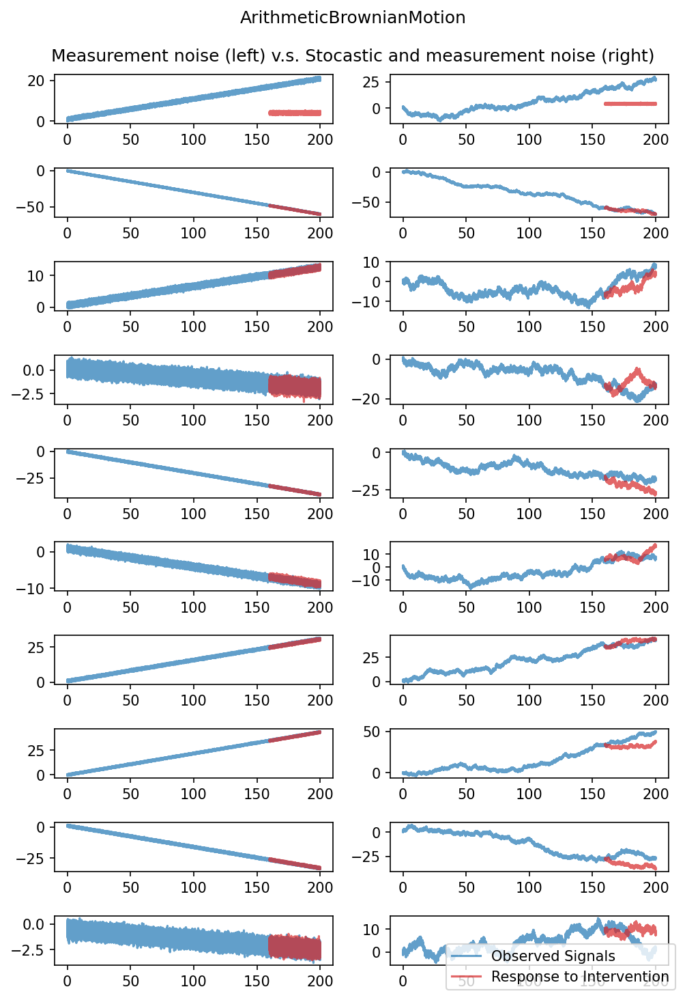

In [5]:
dim = 10

params = dict(
    model_type=interfere.dynamics.ArithmeticBrownianMotion,
    model_params={
        "mu": np.array([0.1, -0.3, 0.06, -0.01, -0.2,
                        -0.05, 0.15, 0.22, -0.17, -0.01]), 
        "sigma": np.zeros(dim),
        "measurement_noise_std": 0.3 * np.ones(dim)
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 4.0},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = np.ones(dim)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Attracting Fixed Point 4D

Simulation time: 1.678347110748291 Estimated job time: 0.02331037653817071 hours.


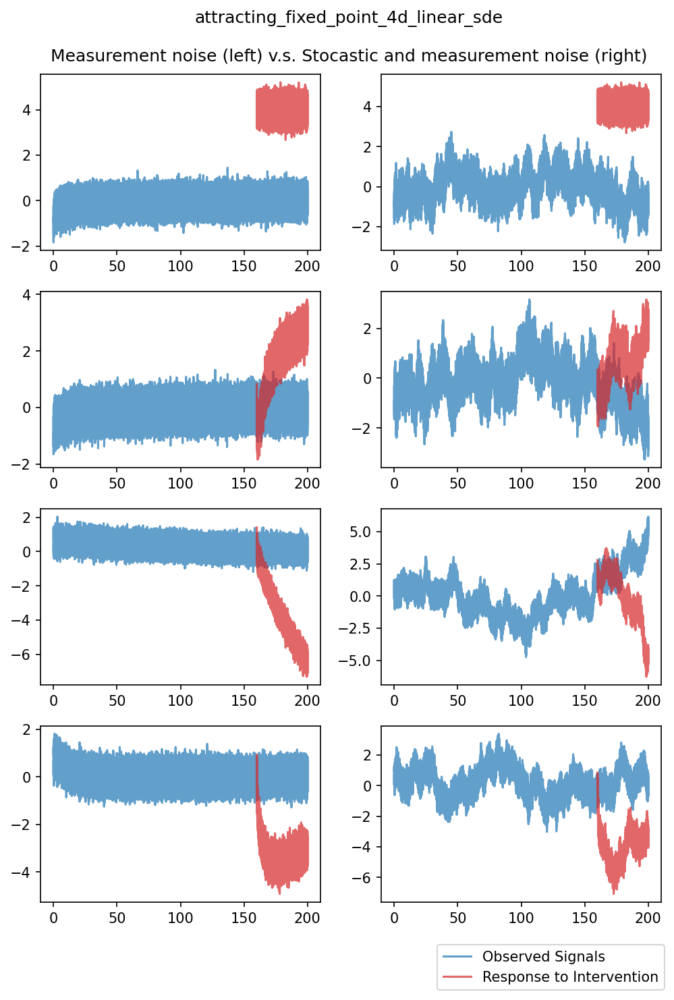

In [6]:
dim = 4

params = dict(
    model_type=interfere.dynamics.attracting_fixed_point_4d_linear_sde,
    model_params={"sigma": 0.0, "measurement_noise_std": 0.3 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 4.0},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Belozyorov 3D Quadratic SDE

Simulation time: 1.9638710021972656 Estimated job time: 0.02727598614162869 hours.


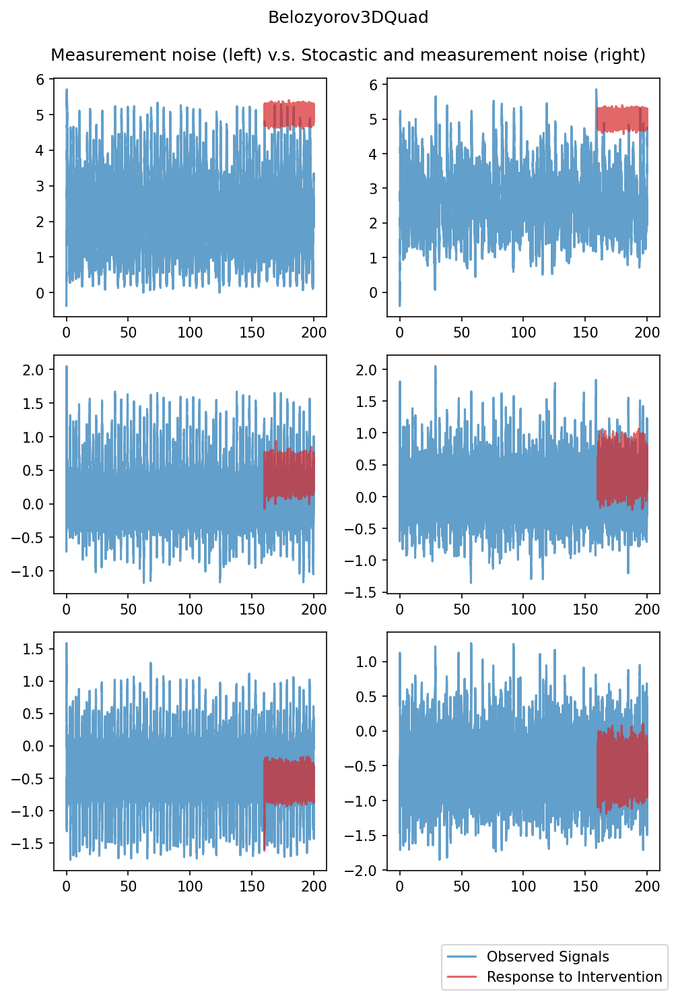

In [7]:
dim = 3

params = dict(
    model_type=interfere.dynamics.Belozyorov3DQuad,
    model_params={
        "mu": 1.81,
        "sigma": 0.0,
        "measurement_noise_std": 0.1 * np.ones(3)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 5.0},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 2.004568099975586 Estimated job time: 0.02784122361077203 hours.


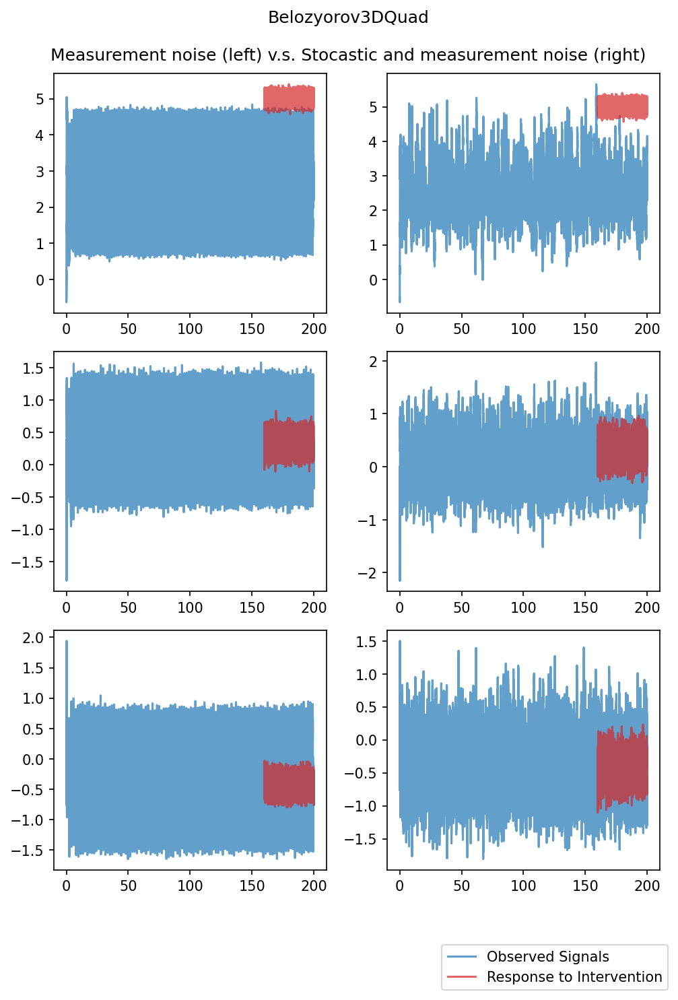

In [8]:
dim = 3

params = dict(
    model_type=interfere.dynamics.Belozyorov3DQuad,
    model_params={
        "mu": 1.4,
        "sigma": 0.0,
        "measurement_noise_std": 0.1 * np.ones(3)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 5.0},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 2.070167064666748 Estimated job time: 0.028752320342593722 hours.


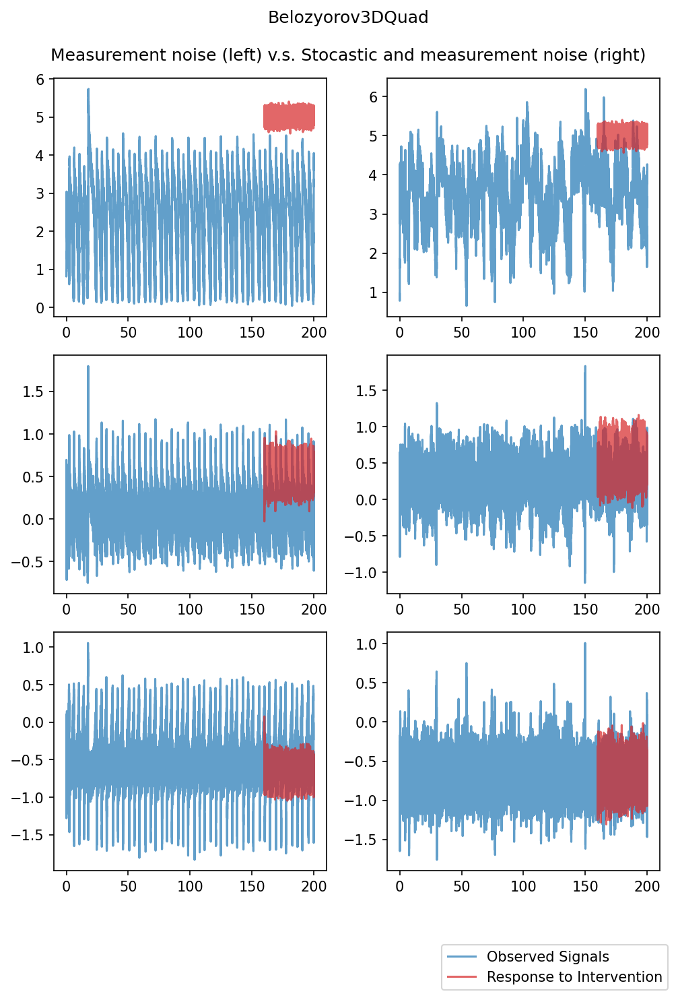

In [9]:
dim = 3

params = dict(
    model_type=interfere.dynamics.Belozyorov3DQuad,
    model_params={
        "mu": 2.2,
        "sigma": 0.0,
        "measurement_noise_std": 0.1 * np.ones(3)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 5.0},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Coupled logistic maps

Simulation time: 0.05085015296936035 Estimated job time: 0.0007062521245744494 hours.


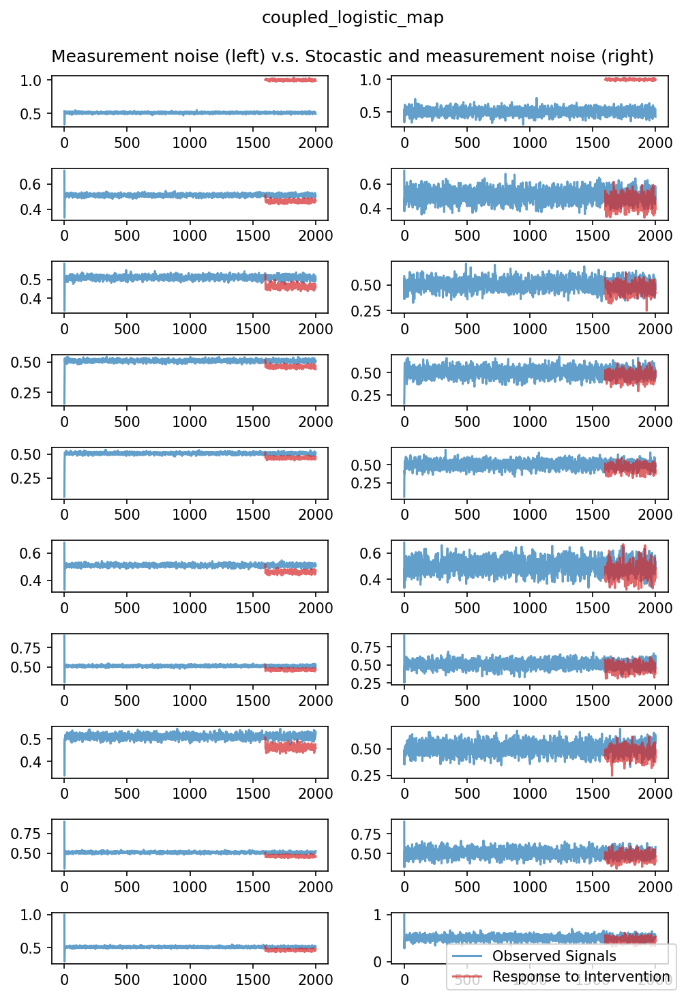

In [10]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_logistic_map,
    model_params={
        "adjacency_matrix": np.ones((dim, dim)),
        "eps": 0.5,
        "logistic_param": 3.72,
        "sigma": 0.0,
        "measurement_noise_std": 0.01 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 1.0},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.05529975891113281 Estimated job time: 0.0007680522070990668 hours.


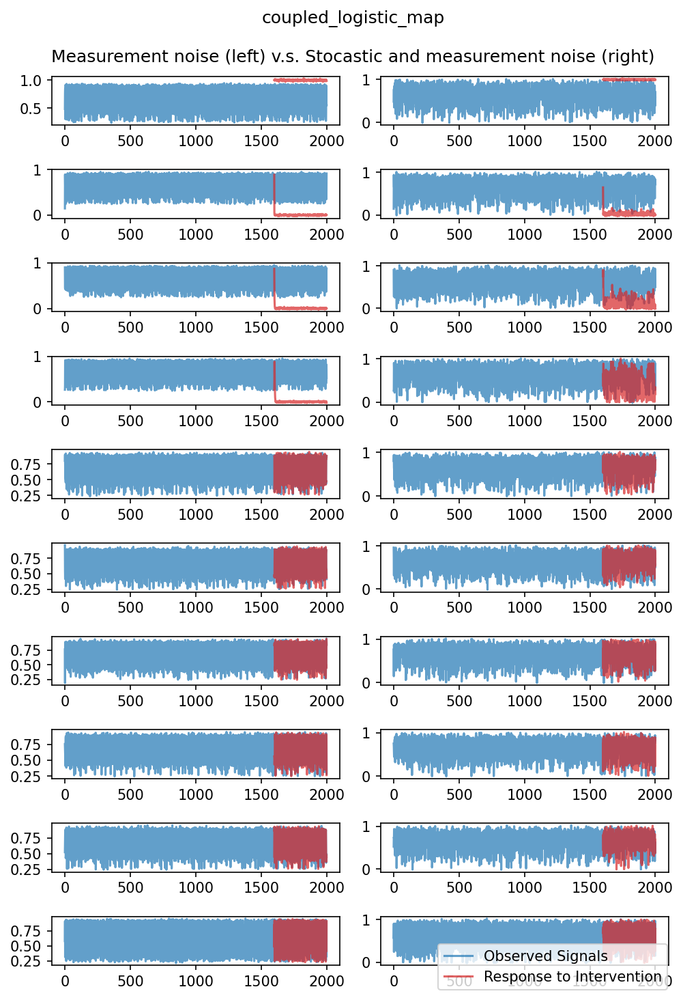

In [11]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_logistic_map,
    model_params={
        # Two cycles and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "eps": 0.9,
        "logistic_param": 3.72,
        "sigma": 0.0,
        "measurement_noise_std": 0.01 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 1.0},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.05006003379821777 Estimated job time: 0.0006952782471974691 hours.


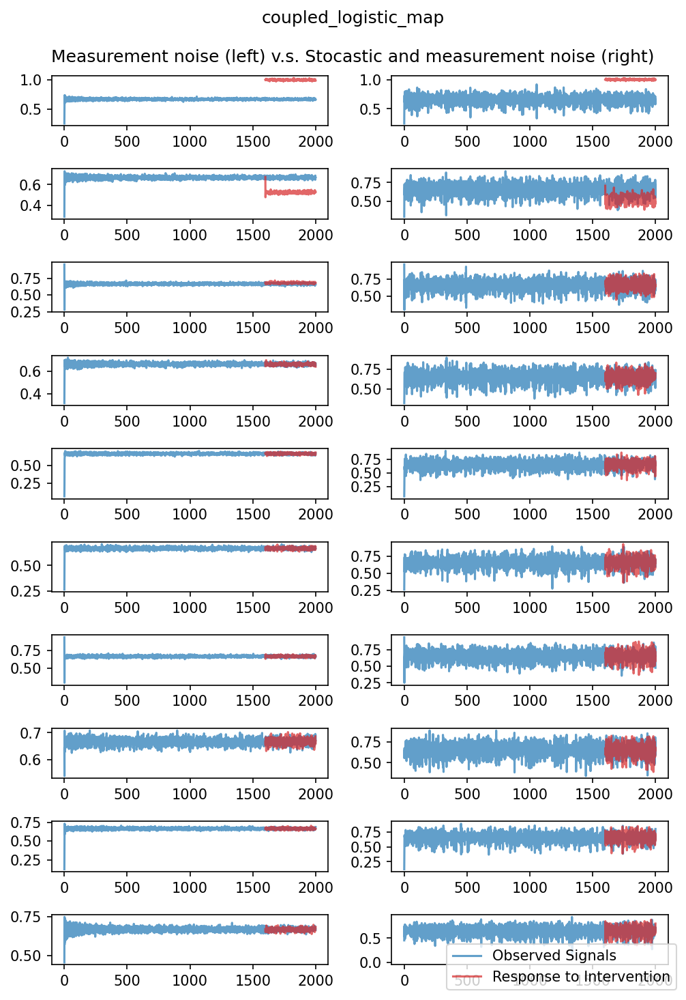

In [12]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_logistic_map,
    model_params={
        # Two cycles and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "eps": 0.3,
        "logistic_param": 3.0,
        "sigma": 0.0,
        "measurement_noise_std": 0.01 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 1.0},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Coupled Lattice Map (quadratic map)

Simulation time: 0.05388021469116211 Estimated job time: 0.0007483363151550293 hours.


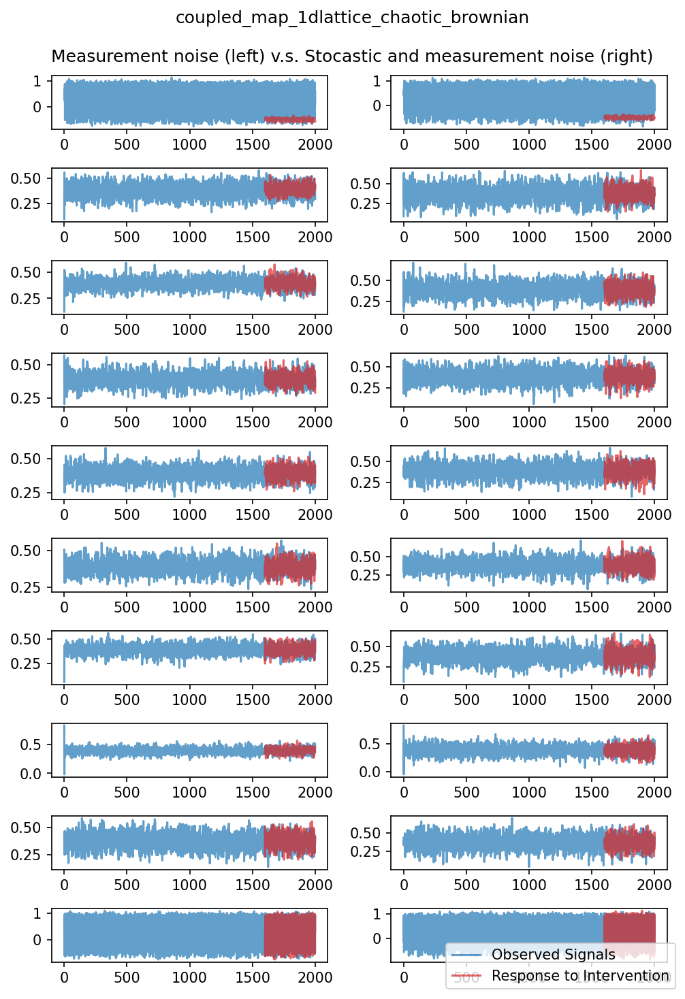

In [13]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_chaotic_brownian,
    model_params={
        "dim": dim,
        "sigma": 0.0,
        "measurement_noise_std": 0.05 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 269.31094694137573 Estimated job time: 3.7404298186302185 hours.


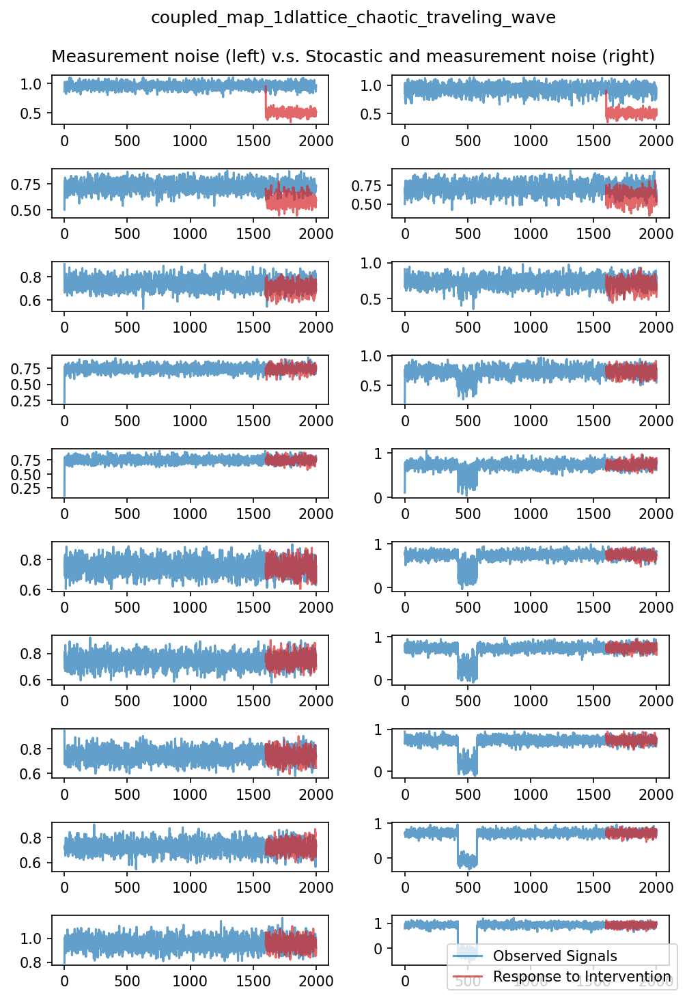

In [14]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_chaotic_traveling_wave,
    model_params={
        "dim": dim,
        "sigma": 0.0,
        "measurement_noise_std": 0.05 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.052214860916137695 Estimated job time: 0.0007252064016130236 hours.


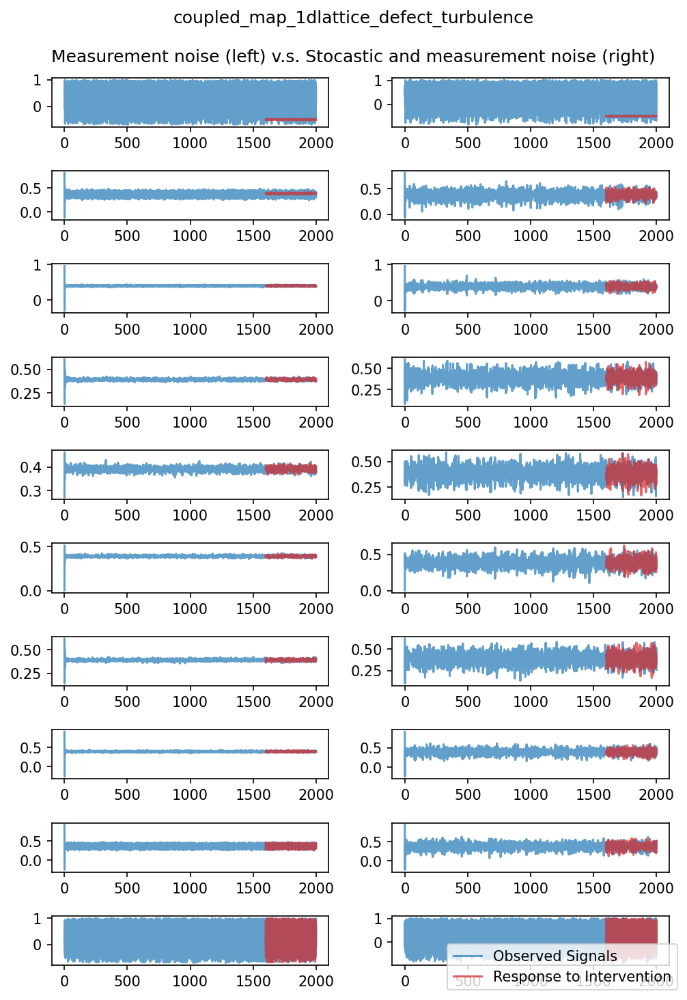

In [15]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_defect_turbulence,
    model_params={
        "dim": dim,
        "sigma": 0.0,
        "measurement_noise_std": 0.01 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.03640604019165039 Estimated job time: 0.0005056394471062554 hours.


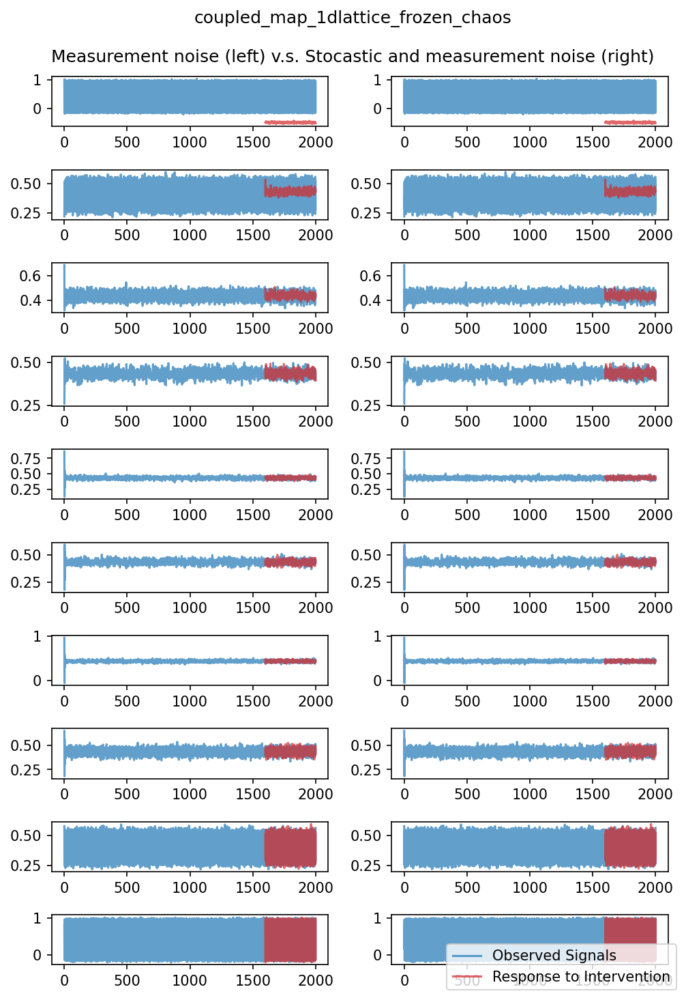

In [16]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_frozen_chaos,
    model_params={
        "dim": dim,
        "sigma": 0.0,
        "measurement_noise_std": 0.02 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.03376603126525879 Estimated job time: 0.00046897265646192763 hours.


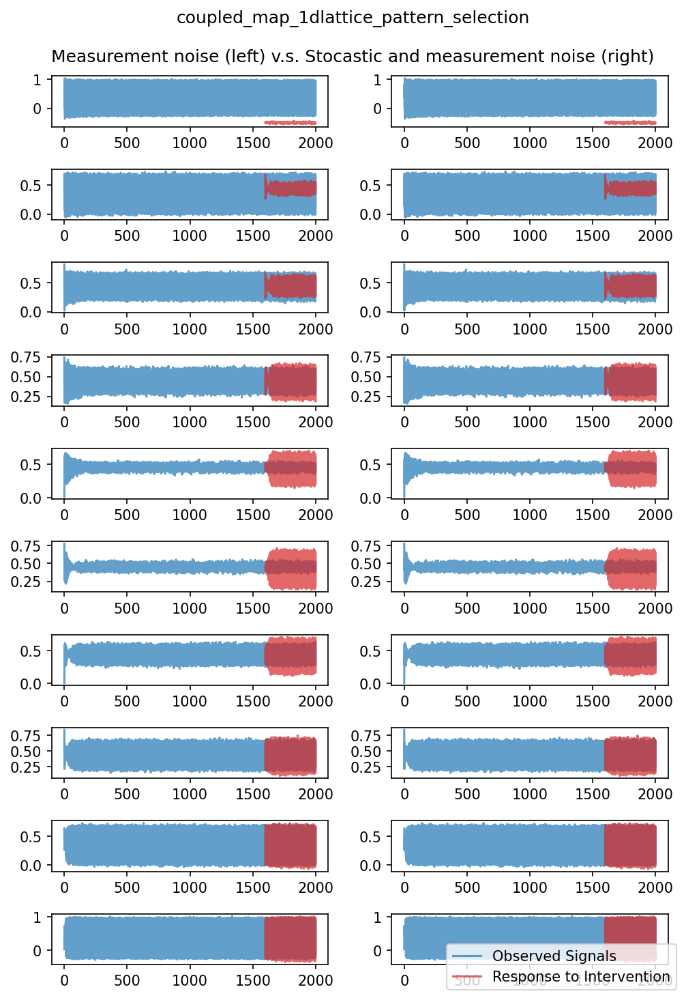

In [17]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_pattern_selection,
    model_params={
        "dim": dim,
        "sigma": 0.0,
        "measurement_noise_std": 0.02 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.055258989334106445 Estimated job time: 0.0007674859629737006 hours.


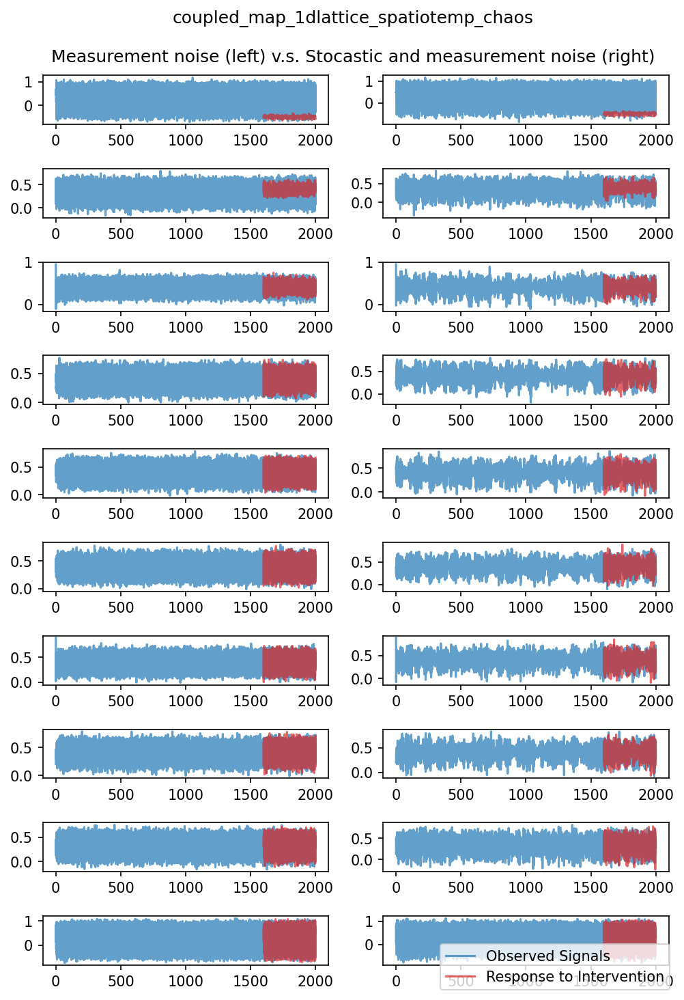

In [18]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_spatiotemp_chaos,
    model_params={
        "dim": dim,
        "sigma": 0.0,
        "measurement_noise_std": 0.05 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.7302200794219971 Estimated job time: 0.010141945547527738 hours.


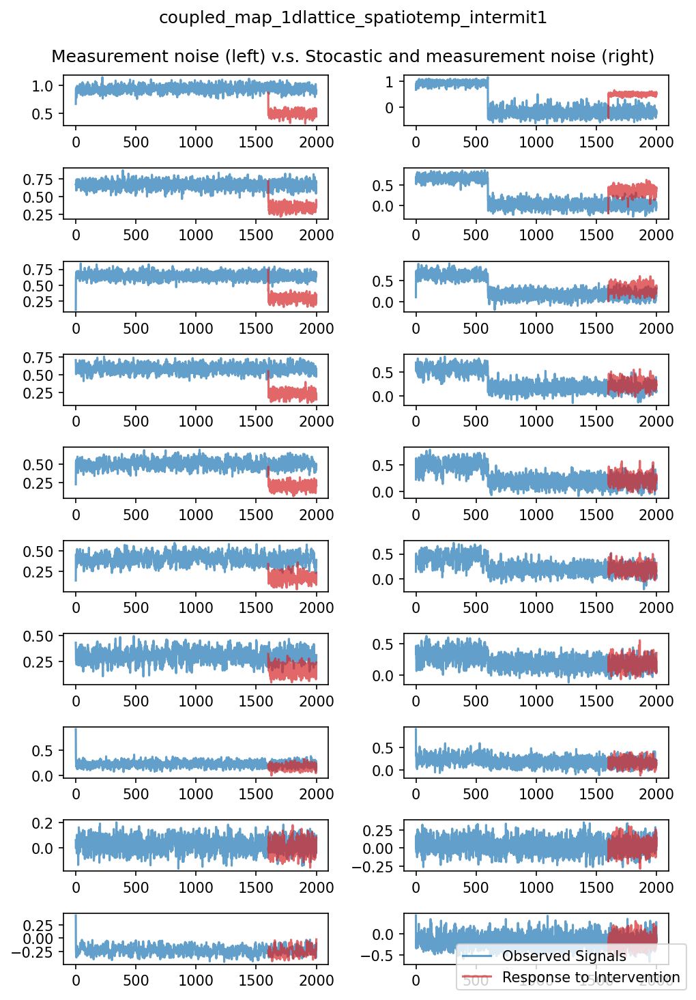

In [19]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_spatiotemp_intermit1,
    model_params={
        "dim": dim,
        "sigma": 0.0,
        "measurement_noise_std": 0.05 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 106.3964569568634 Estimated job time: 1.477728568845325 hours.


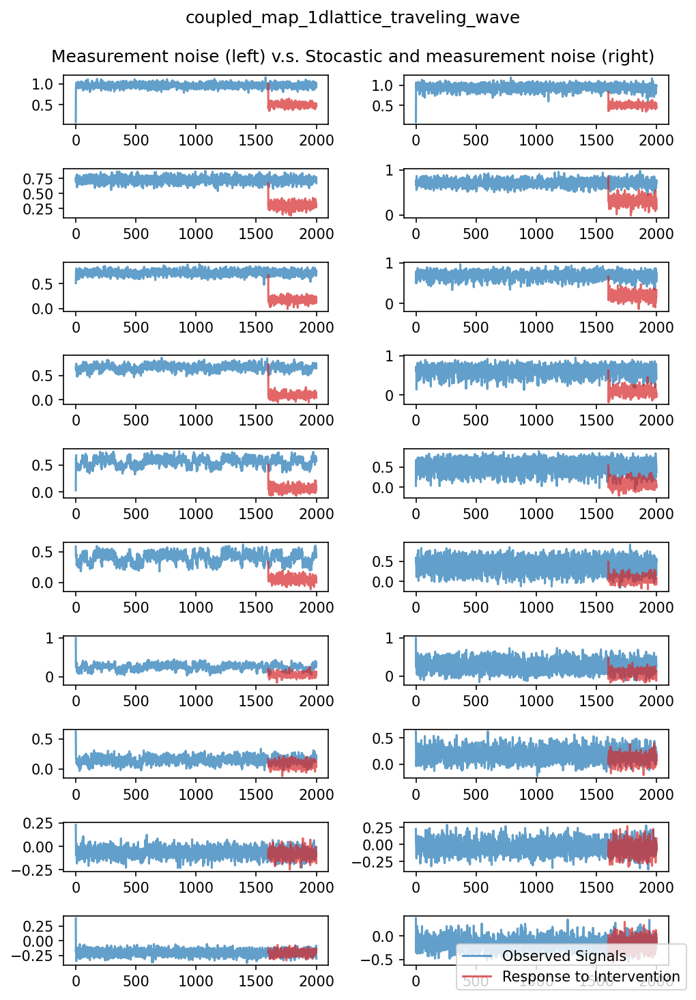

In [20]:
dim = 10

params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_traveling_wave,
    model_params={
        "dim": dim,
        "sigma": 0.0,
        "measurement_noise_std": 0.05 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Damped Oscilator

Simulation time: 1.6448619365692139 Estimated job time: 0.022845304674572416 hours.


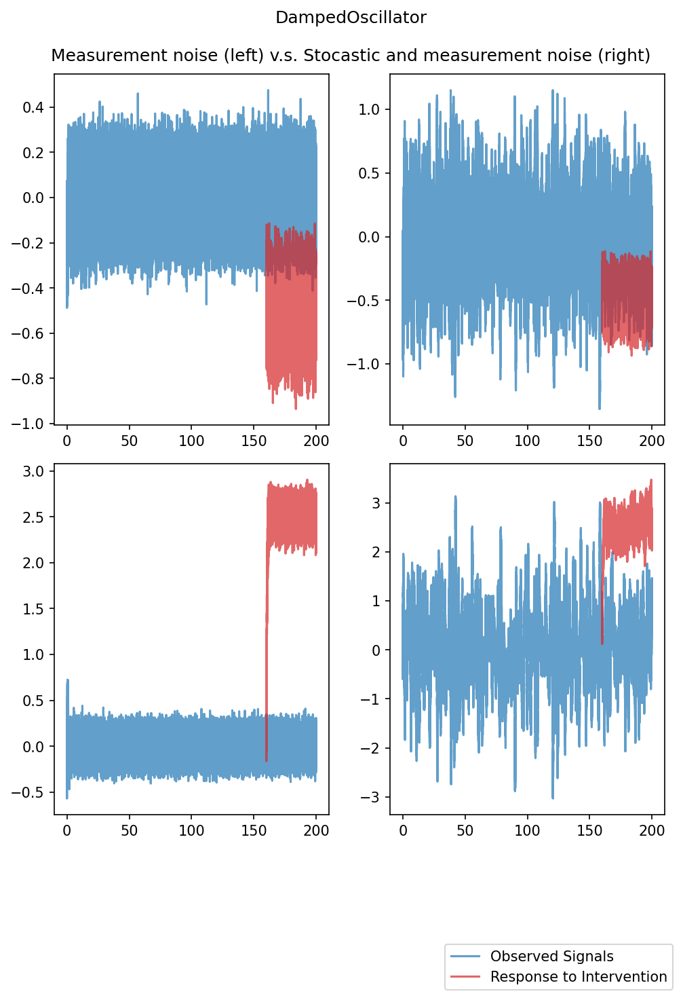

In [21]:
dim = 2

params = dict(
    model_type=interfere.dynamics.DampedOscillator,
    model_params={"m": 1.0, "c": 2, "k": 10, "sigma": 0,
                  "measurement_noise_std": 0.1 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 1.4970297813415527 Estimated job time: 0.020792080296410456 hours.


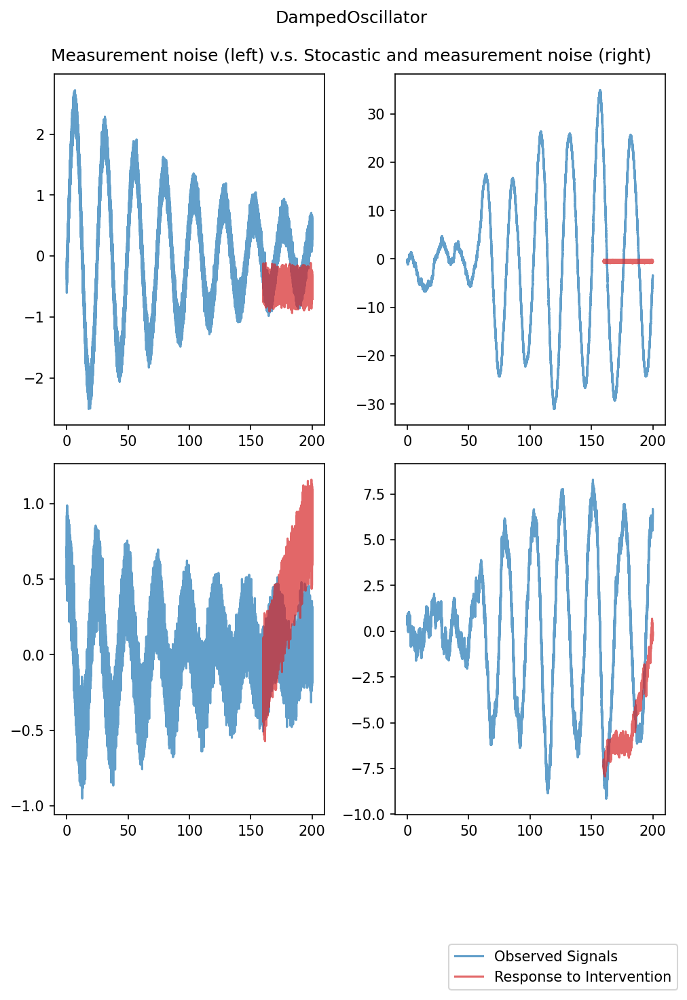

In [22]:
dim = 2

params = dict(
    model_type=interfere.dynamics.DampedOscillator,
    model_params={"m": 30.0, "c": 0.5, "k": 2, "sigma": 0,
                  "measurement_noise_std": 0.1 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Geometric Browian Motion

Simulation time: 3.1663408279418945 Estimated job time: 0.04397695594363742 hours.


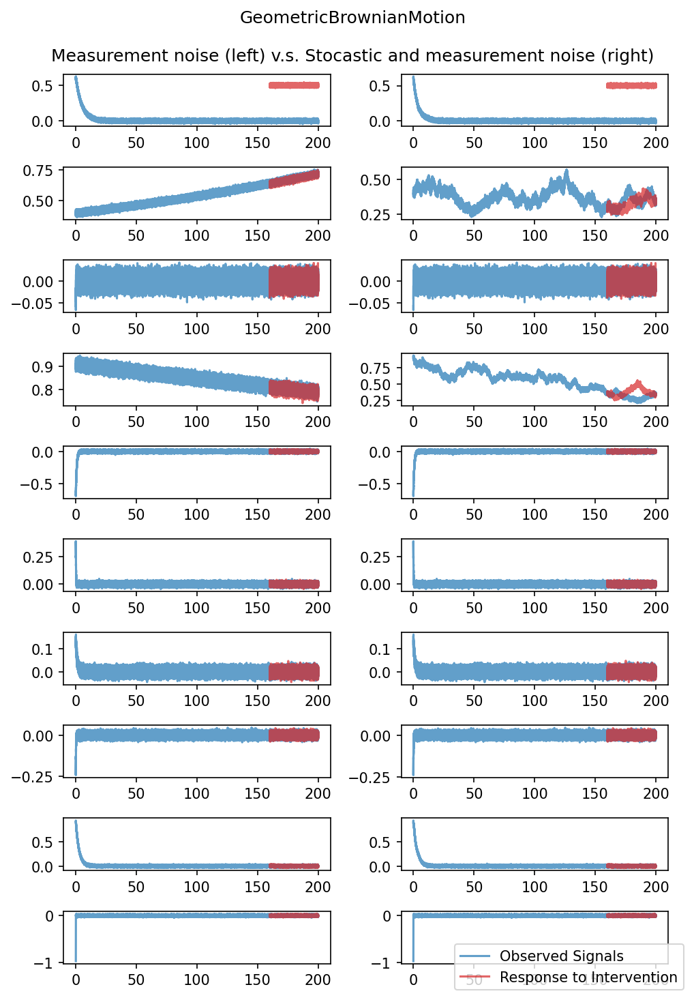

In [23]:
dim = 10

params = dict(
    model_type=interfere.dynamics.GeometricBrownianMotion,
    model_params={
        "mu": np.array([
            -0.2, 0.003, -10, -0.0007, -1.3, -6, -0.8, -7, -0.38, -99.0]),
        "sigma": np.zeros(dim),
        "measurement_noise_std": 0.01 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05 * np.ones(dim)

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 3.210843086242676 Estimated job time: 0.044595042864481606 hours.


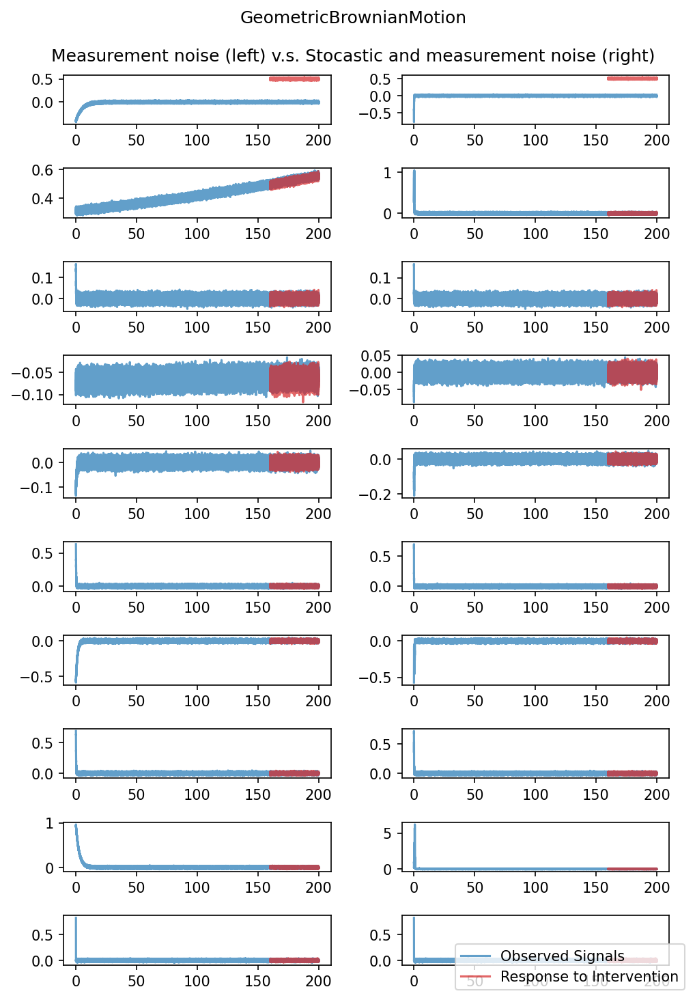

In [24]:
dim = 10

params = dict(
    model_type=interfere.dynamics.GeometricBrownianMotion,
    model_params={
        "mu": np.array([
            -0.2, 0.003, -10, -0.0007, -1.3, -6, -0.8, -7, -0.38, -99.0]),
        "sigma": np.zeros(dim),
        "measurement_noise_std": 0.01 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 3 * np.ones(dim)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Hodgkin Huxley 

In [25]:
from pyclustering.nnet.hhn import hhn_parameters

Simulation time: 865.1237761974335 Estimated job time: 12.015608002742132 hours.


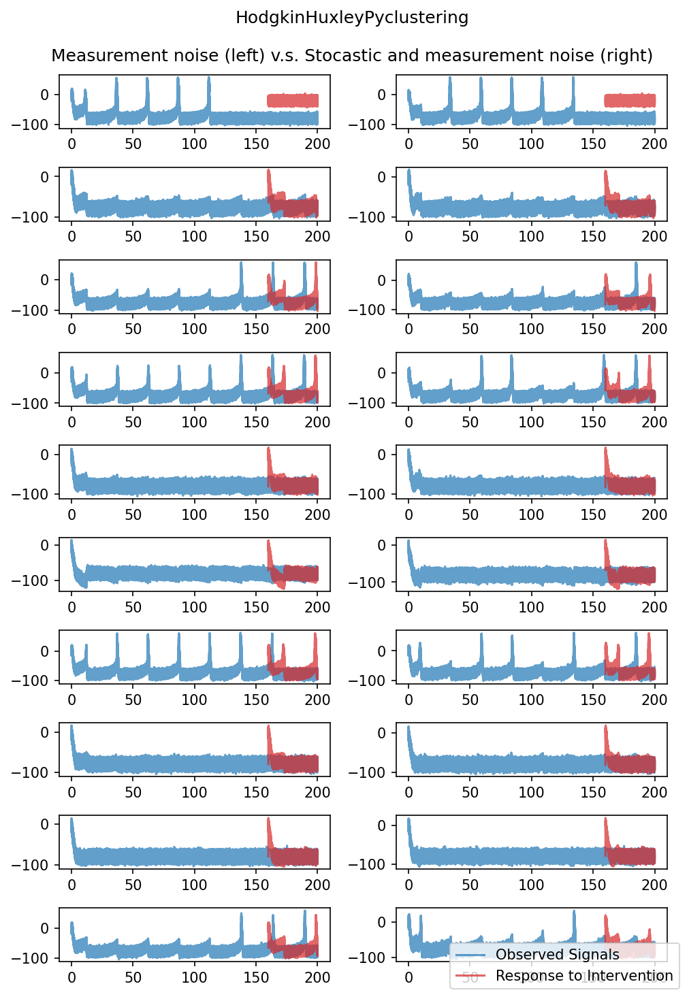

In [26]:
dim = 10

hh_ps = hhn_parameters()
hh_ps.w1 = 0
hh_ps.w2 = 1.0
hh_ps.w3 = 0


params = dict(
    model_type=interfere.dynamics.HodgkinHuxleyPyclustering,
    model_params={
        "stimulus": NOTEBOOK_RNG.random(dim) * 50 - 20,
        "sigma": np.zeros(dim),
        "measurement_noise_std": 5 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -20},
    initial_conds=uniform_init_cond(-40, 10, dim, REPS),
    start_time=0, end_time=200, dt=0.0001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 5 * np.ones(dim)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Imaginary Roots 4D

Simulation time: 2.4507598876953125 Estimated job time: 0.03403833177354601 hours.


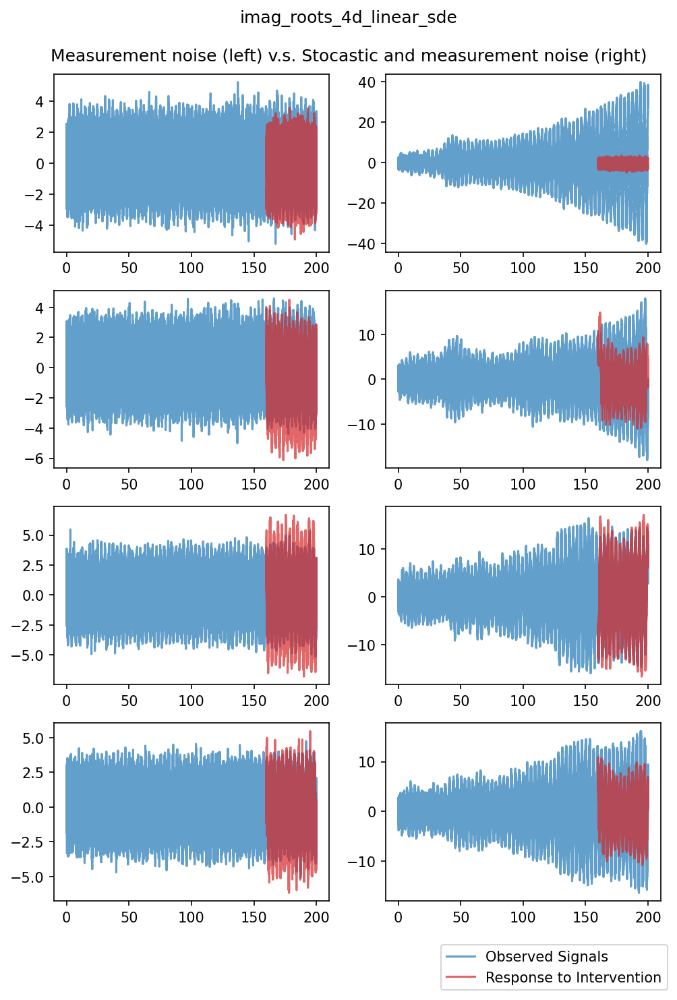

In [27]:
dim = 4

params = dict(
    model_type=interfere.dynamics.imag_roots_4d_linear_sde,
    model_params={"sigma": 0,
                  "measurement_noise_std": np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(0, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Kuramoto Oscilators

Simulation time: 6.473861217498779 Estimated job time: 0.08991473913192749 hours.


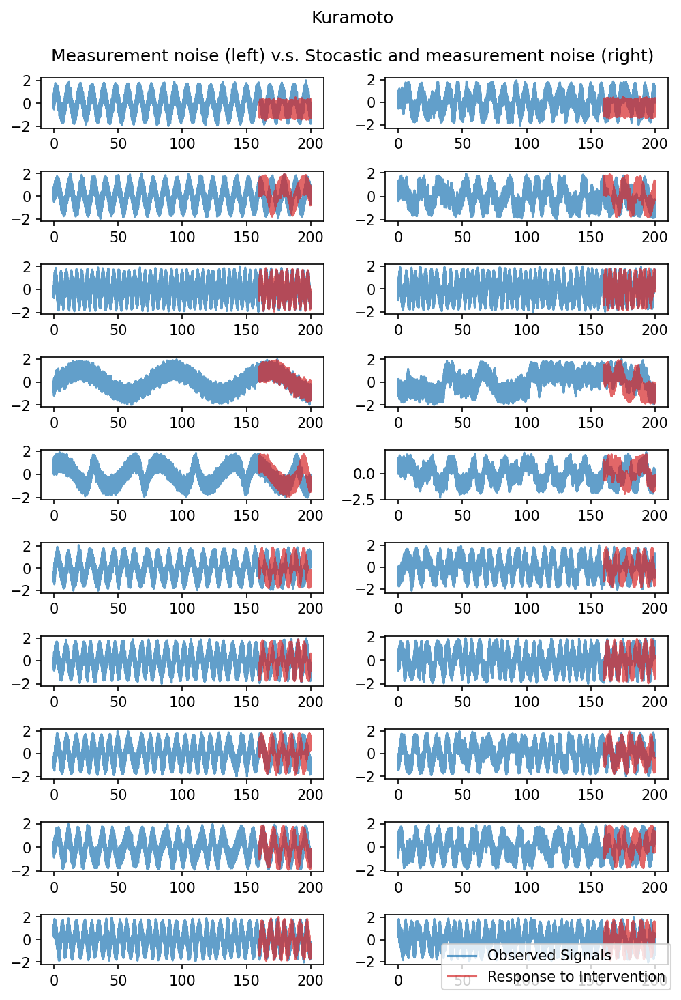

In [28]:
dim = 10

params = dict(
    model_type=interfere.dynamics.Kuramoto,
    model_params={
        "omega": NOTEBOOK_RNG.random(10) * np.pi / 2,
        "K": 2.5,
        # A chain network
        "adjacency_matrix": np.array([
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 6.374139785766602 Estimated job time: 0.08852971924675836 hours.


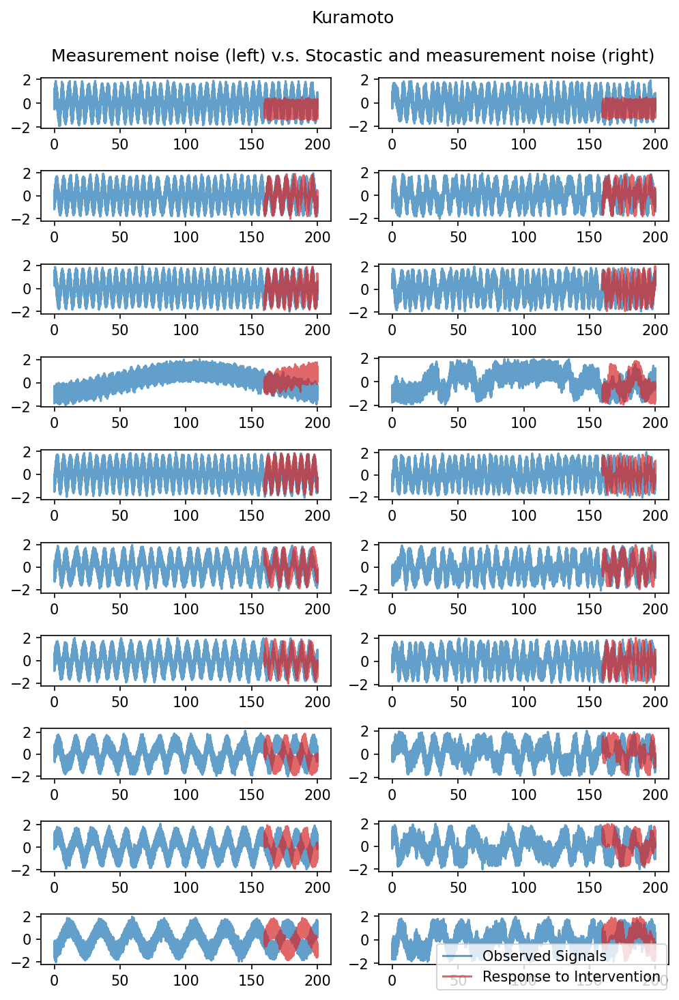

In [29]:
dim = 10

params = dict(
    model_type=interfere.dynamics.Kuramoto,
    model_params={
        "omega": NOTEBOOK_RNG.random(10) * np.pi / 2,
        "K": 2.5,
        # A cycle and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 6.111763000488281 Estimated job time: 0.0848855972290039 hours.


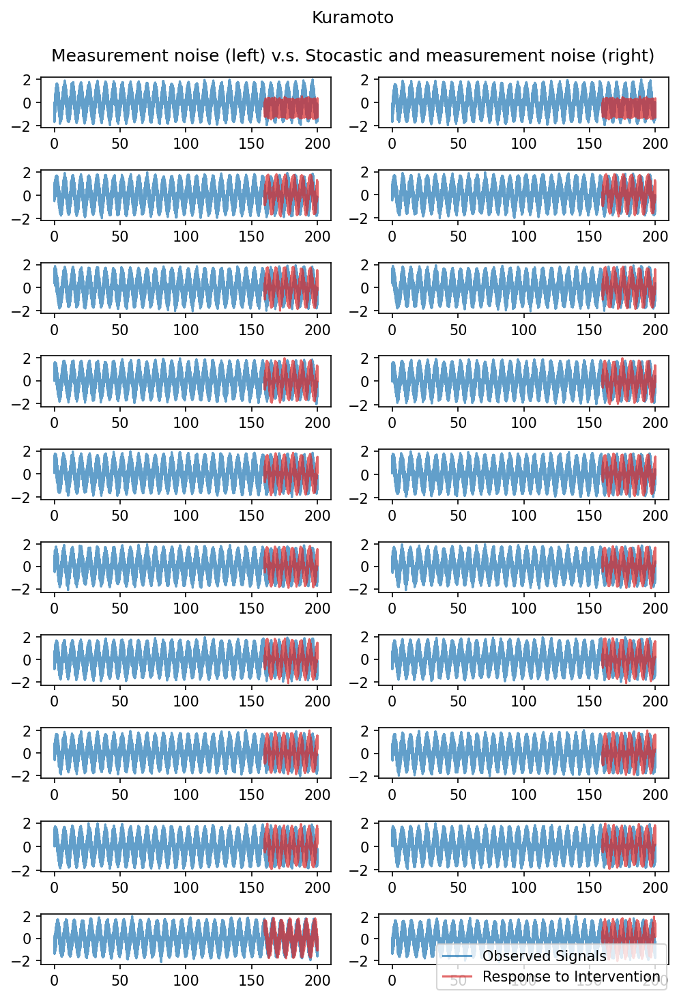

In [30]:
dim = 10

params = dict(
    model_type=interfere.dynamics.Kuramoto,
    model_params={
        # All nodes have the same fundamental frequency
        "omega": np.ones(dim),
        "K": 2.5,
        # A cycle and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    # Nodes begin synchronized but the intervention reveals coupling.
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.1

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Kuramoto-Sakaguchi

Simulation time: 6.552833080291748 Estimated job time: 0.09101157055960761 hours.


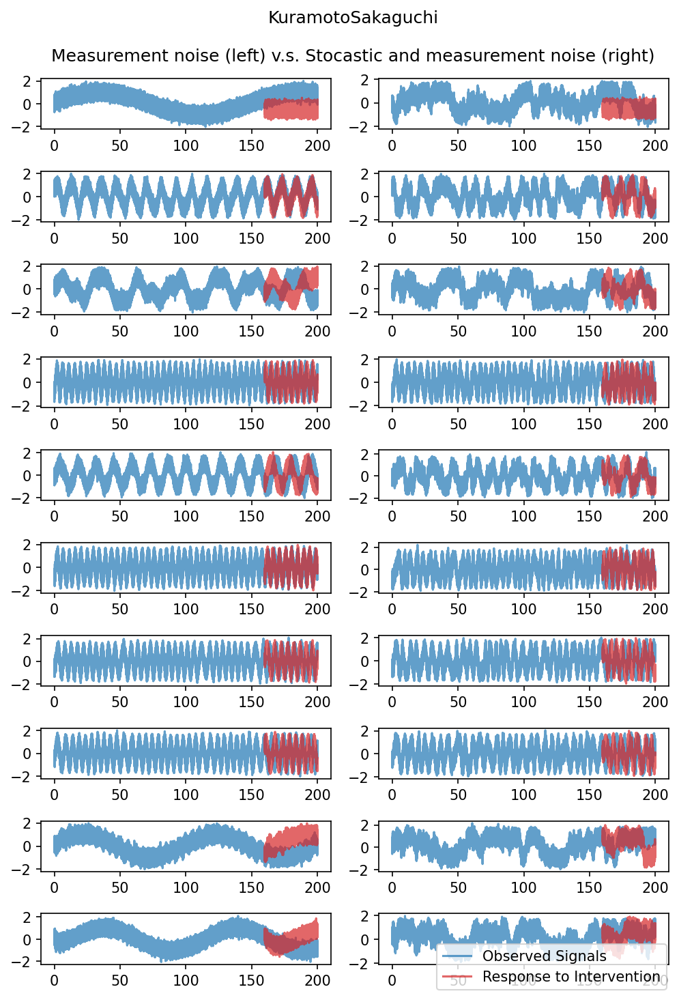

In [31]:
dim = 10

params = dict(
    model_type=interfere.dynamics.KuramotoSakaguchi,
    model_params={
        "omega": NOTEBOOK_RNG.random(dim) * np.pi / 2,
        "K": 2.5,
        # A chain network
        "adjacency_matrix": np.array([
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
        ]),
        "phase_frustration": np.array([
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 6.988887071609497 Estimated job time: 0.09706787599457635 hours.


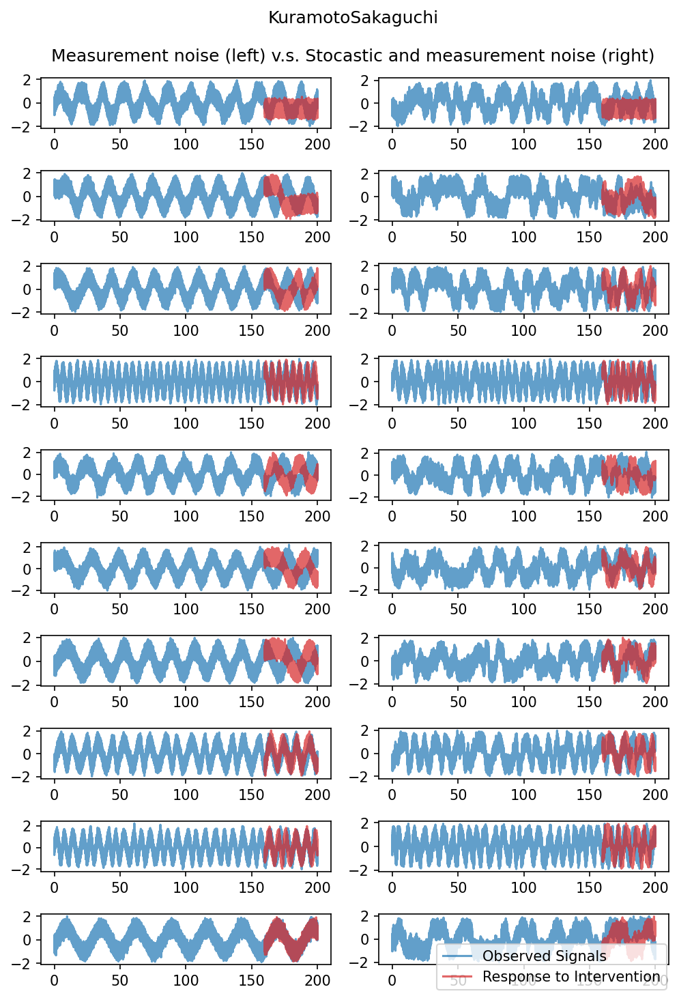

In [32]:
dim = 10

params = dict(
    model_type=interfere.dynamics.KuramotoSakaguchi,
    model_params={
        "omega": NOTEBOOK_RNG.random(dim) * np.pi / 2,
        "K": 2.5,
        # Three cycle and isolated node
        # A cycle and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "phase_frustration": np.array([
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_conds=uniform_init_cond(-1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 9.92133903503418 Estimated job time: 0.13779637548658583 hours.


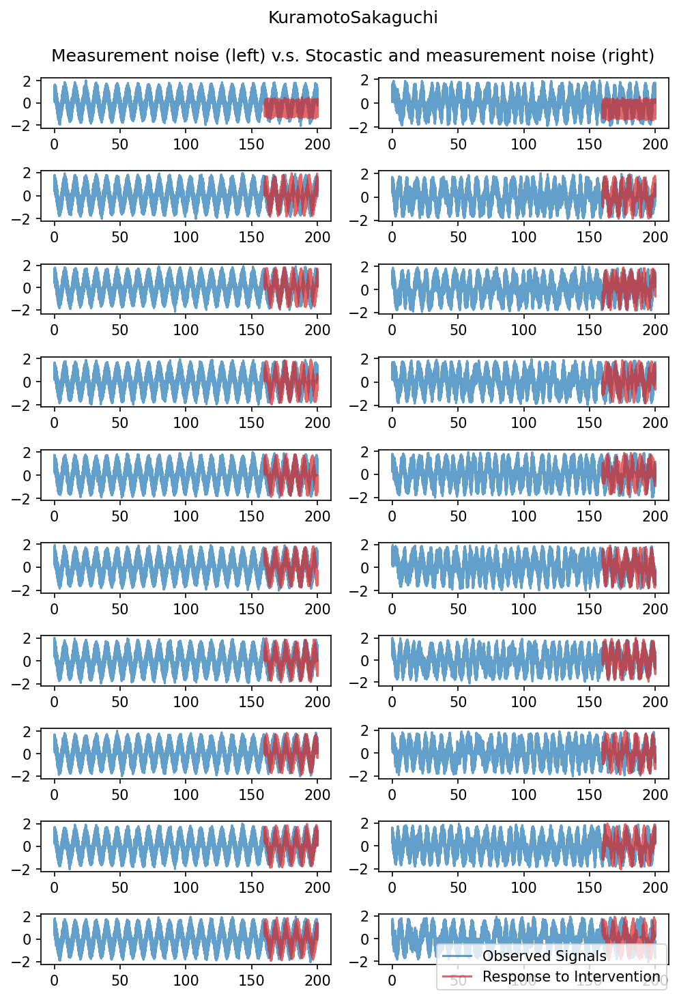

In [33]:
dim = 10

params = dict(
    model_type=interfere.dynamics.KuramotoSakaguchi,
    model_params={
        # All nodes have the same fundamental frequency
        "omega": np.ones(dim),
        "K": 2.5,
        # A cycle and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "phase_frustration": np.array([
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    # Nodes begin synchronized but the intervention reveals coupling.
    initial_conds=uniform_init_cond(1, 1, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Liping Finance Model

Simulation time: 2.9329419136047363 Estimated job time: 0.04073530435562134 hours.


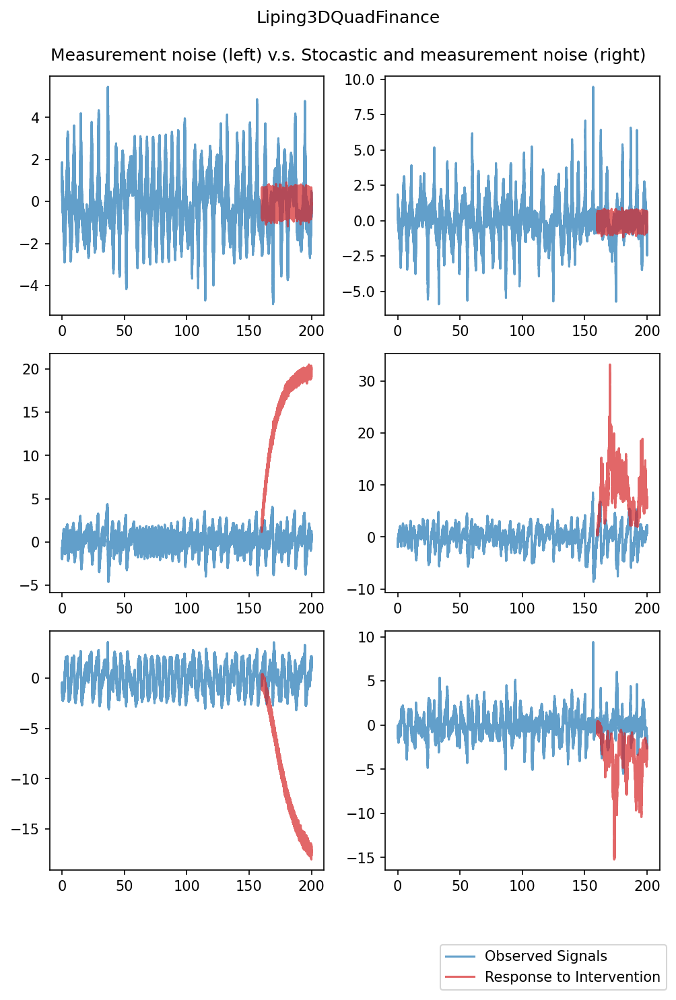

In [34]:
dim = 3

params = dict(
    model_type=interfere.dynamics.Liping3DQuadFinance,
    model_params={
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim),
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.1},
    initial_conds=uniform_init_cond(-2, 2, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Lotka Voltera

Simulation time: 4.065068960189819 Estimated job time: 0.05645929111374749 hours.


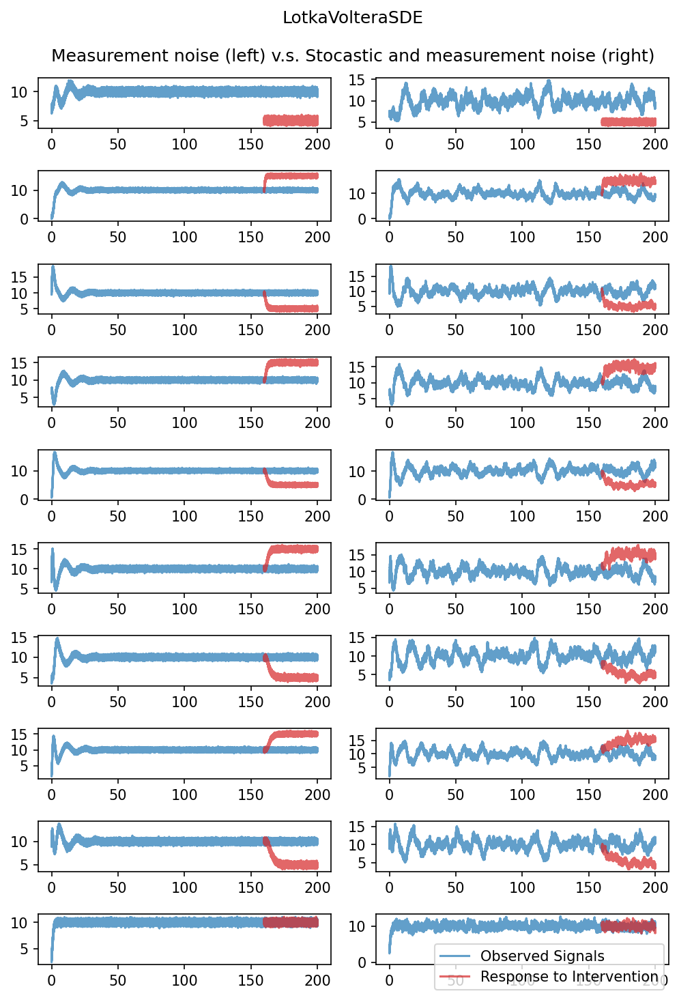

In [35]:
dim = 10

params = dict(
    model_type=interfere.dynamics.LotkaVolteraSDE,
    model_params={
        "growth_rates": 5 * NOTEBOOK_RNG.random(dim),
        "capacities": 20 * np.ones(dim),
        # A cycle and isolated node
        "interaction_mat": np.array([
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 5.0},
    initial_conds=uniform_init_cond(0, 10, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.1

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 4.368682146072388 Estimated job time: 0.06067614091767205 hours.


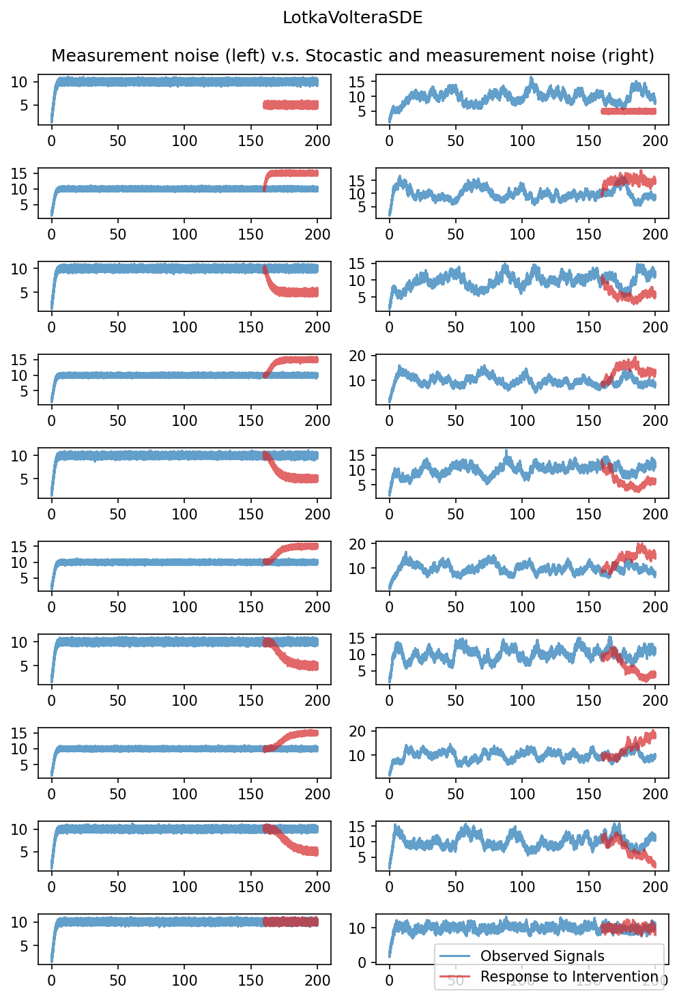

In [36]:
dim = 10

params = dict(
    model_type=interfere.dynamics.LotkaVolteraSDE,
    model_params={
        # All nodes have the same growth rate
        "growth_rates": np.ones(dim),
        "capacities": 20 * np.ones(dim),
        # Three cycle and isolated node
        "interaction_mat": np.array([
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 5.0},
    # Nodes begin synchronized but the intervention reveals coupling.
    initial_conds=uniform_init_cond(2, 2, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.1

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 4.573543071746826 Estimated job time: 0.06352143155203925 hours.


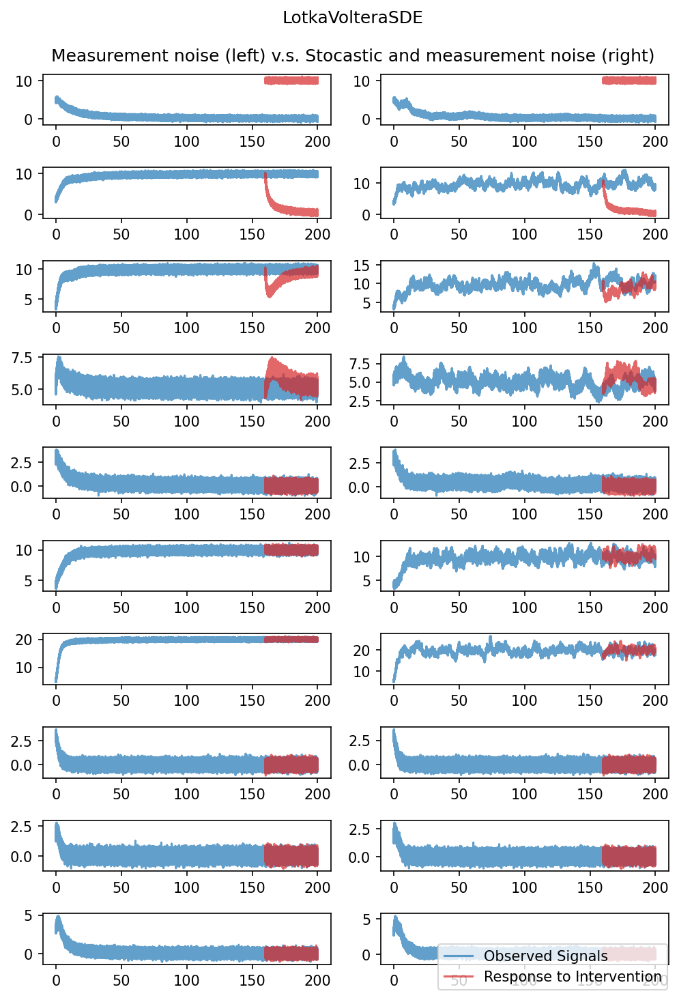

In [37]:
dim = 10

params = dict(
    model_type=interfere.dynamics.LotkaVolteraSDE,
    model_params={
        # All nodes have the same growth rate
        "growth_rates": np.ones(dim),
        "capacities": 20 * np.ones(dim),
        # Erdos-Renyi with mean degree 3
        "interaction_mat": NOTEBOOK_RNG.random((dim, dim)) < 3 / dim,
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 10.0},
    # Nodes begin synchronized but the intervention reveals coupling.
    initial_conds=uniform_init_cond(0, 6, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.1

plot_helper(params, noise_params)

all_params += [params, noise_params]

/Users/djpassey/Code/interfere/interfere/dynamics/lotka_voltera.py:81: RuntimeWarning: overflow encountered in multiply
  return self.growth_rates * x * (
/Users/djpassey/Code/interfere/interfere/dynamics/lotka_voltera.py:137: RuntimeWarning: invalid value encountered in multiply
  return self.sigma * np.diag(x)
/Users/djpassey/Code/interfere/interfere/dynamics/lotka_voltera.py:82: RuntimeWarning: invalid value encountered in matmul
  1 -  (x + self.interaction_mat @ x) / self.capacities


Simulation time: 5.159290075302124 Estimated job time: 0.07165680660141839 hours.


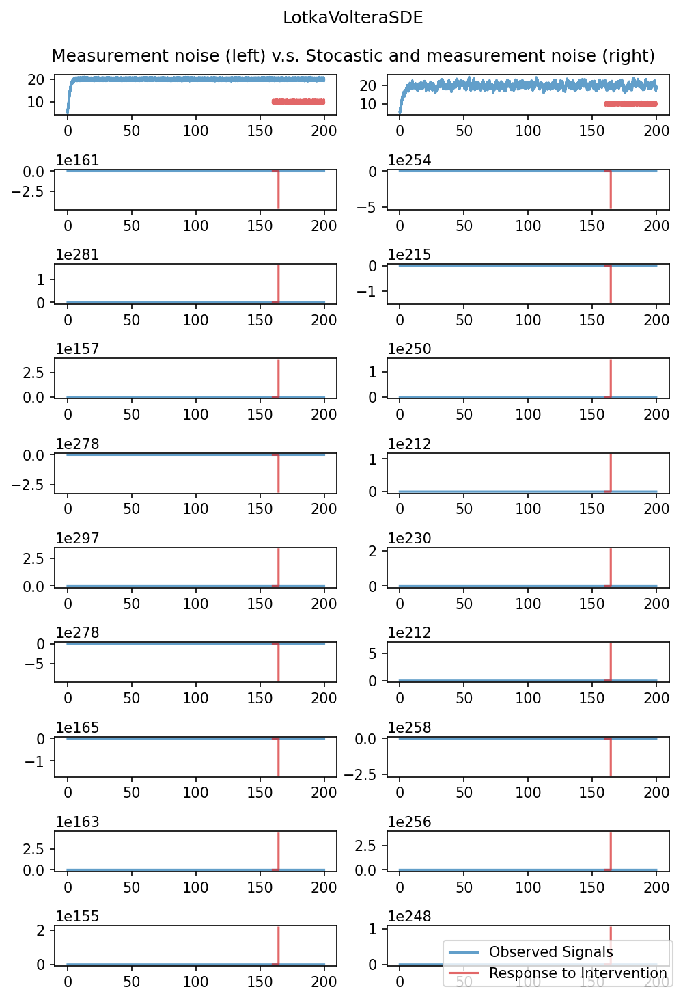

In [38]:
dim = 10

params = dict(
    model_type=interfere.dynamics.LotkaVolteraSDE,
    model_params={
        "growth_rates": 2 * NOTEBOOK_RNG.random(dim),
        "capacities": 20 * np.ones(dim),
        # Erdos-Renyi with mean degree 3
        "interaction_mat": NOTEBOOK_RNG.random((dim, dim)) < 3 / dim,
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 10.0},
    initial_conds=uniform_init_cond(0, 6, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.1

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Ornstein Uhlenbeck

Simulation time: 2.0344350337982178 Estimated job time: 0.02825604213608636 hours.


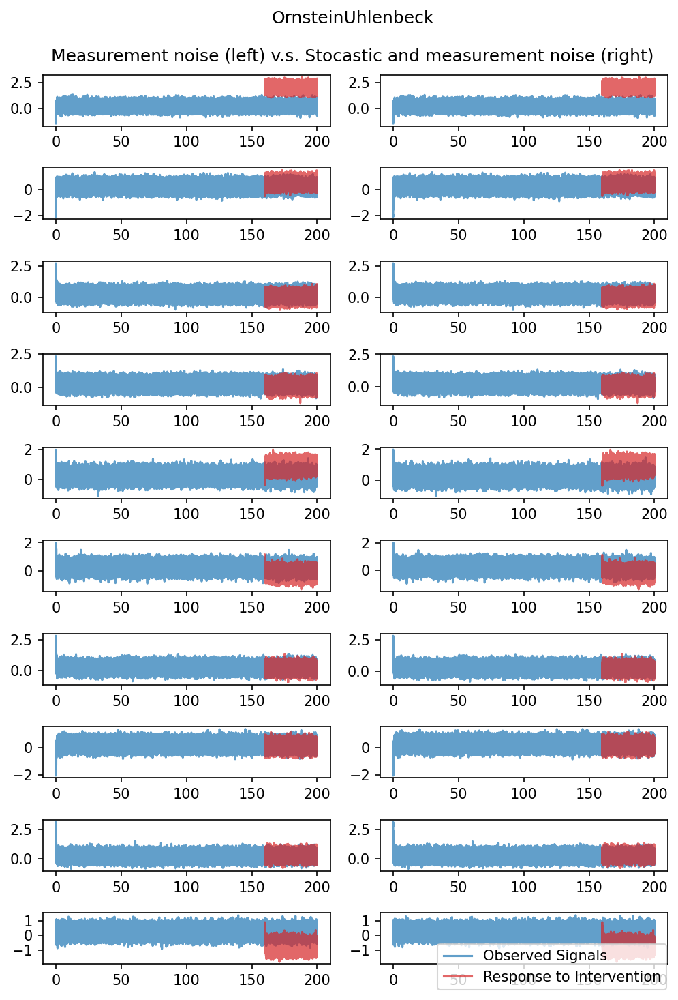

In [39]:
dim = 10

# Random orthonormal matrix
U = np.linalg.svd(NOTEBOOK_RNG.random((dim, dim)))[0]
# Random maxtix with all positive eigs
theta = U @ np.diag(10 * NOTEBOOK_RNG.random(dim)) @ U.T

params = dict(
    model_type=interfere.dynamics.OrnsteinUhlenbeck,
    model_params={
        "mu": 0.25 * np.ones(dim),
        # Chain
        "theta": theta,
        "Sigma": np.zeros((dim, dim)),
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 2.0},
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["Sigma"] = 0.1 * NOTEBOOK_RNG.random((dim, dim)) - 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 2.1219279766082764 Estimated job time: 0.029471221897337172 hours.


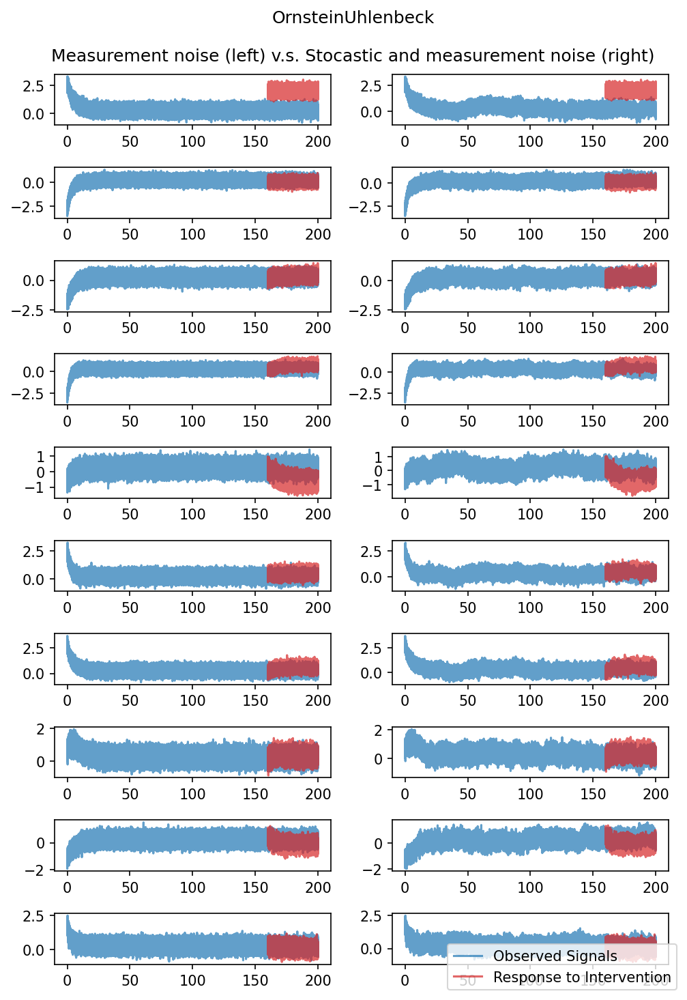

In [40]:
dim = 10

# Random orthonormal matrix
U = np.linalg.svd(NOTEBOOK_RNG.random((dim, dim)))[0]
# Random maxtix with all positive eigs
theta = U @ np.diag(0.5 * NOTEBOOK_RNG.random(dim)) @ U.T

params = dict(
    model_type=interfere.dynamics.OrnsteinUhlenbeck,
    model_params={
        "mu": 0.25 * np.ones(dim),
        # Chain
        "theta": theta,
        "Sigma": np.zeros((dim, dim)),
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 2.0},
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["Sigma"] = 0.1 * NOTEBOOK_RNG.random((dim, dim)) - 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 1.8293378353118896 Estimated job time: 0.025407469934887357 hours.


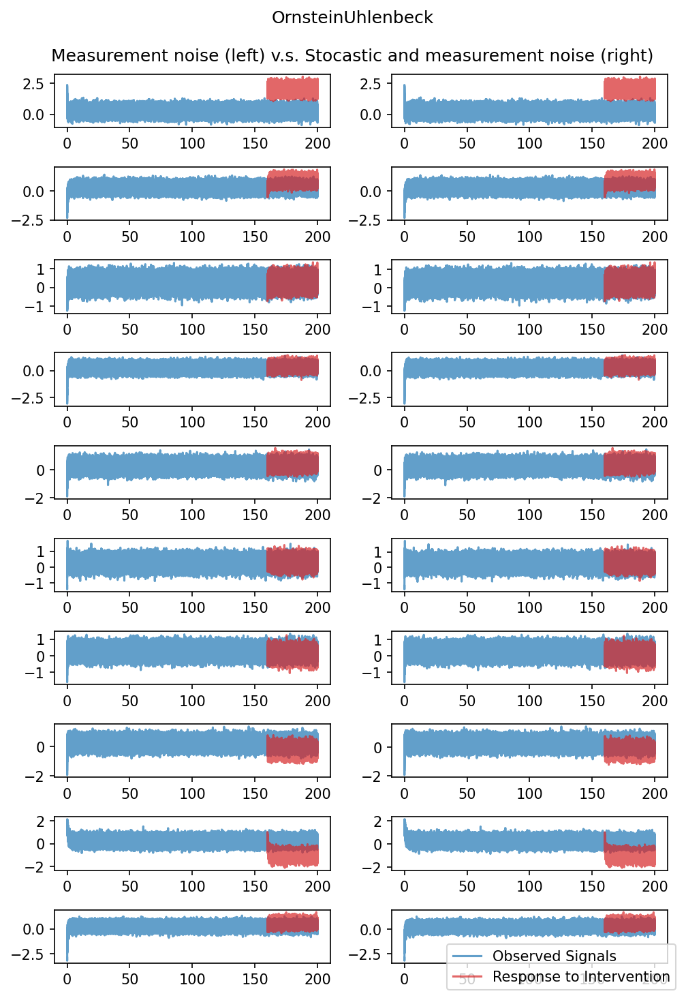

In [41]:
dim = 10

# Random orthonormal matrix
U = np.linalg.svd(NOTEBOOK_RNG.random((dim, dim)))[0]
# Random maxtix with all positive eigs
theta = U @ np.diag(10 * NOTEBOOK_RNG.random(dim)) @ U.T

params = dict(
    model_type=interfere.dynamics.OrnsteinUhlenbeck,
    model_params={
        "mu": 0.25 * np.ones(dim),
        # Chain
        "theta": theta,
        "Sigma": np.zeros((dim, dim)),
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 2.0},
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["Sigma"] = 0.1 * NOTEBOOK_RNG.random((dim, dim)) - 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 1.9147369861602783 Estimated job time: 0.026593569252226088 hours.


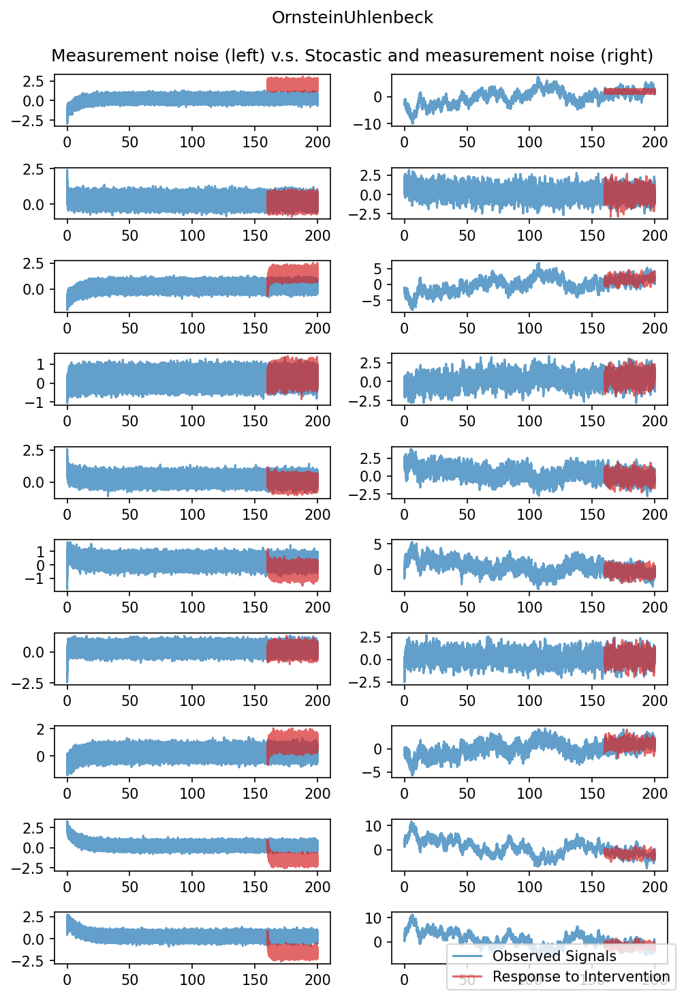

In [42]:
dim = 10

# Random orthonormal matrix
U = np.linalg.svd(NOTEBOOK_RNG.random((dim, dim)))[0]
# Random maxtix with all positive eigs
theta = U @ np.diag(10 * NOTEBOOK_RNG.random(dim)) @ U.T

params = dict(
    model_type=interfere.dynamics.OrnsteinUhlenbeck,
    model_params={
        "mu": 0.25 * np.ones(dim),
        # Chain
        "theta": theta,
        "Sigma": np.zeros((dim, dim)),
        "measurement_noise_std": 0.25 * np.ones(dim)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 2.0},
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["Sigma"] = 2 * NOTEBOOK_RNG.random((dim, dim)) - 1

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Uncorrelated Noise

Simulation time: 0.1685469150543213 Estimated job time: 0.0023409293757544625 hours.


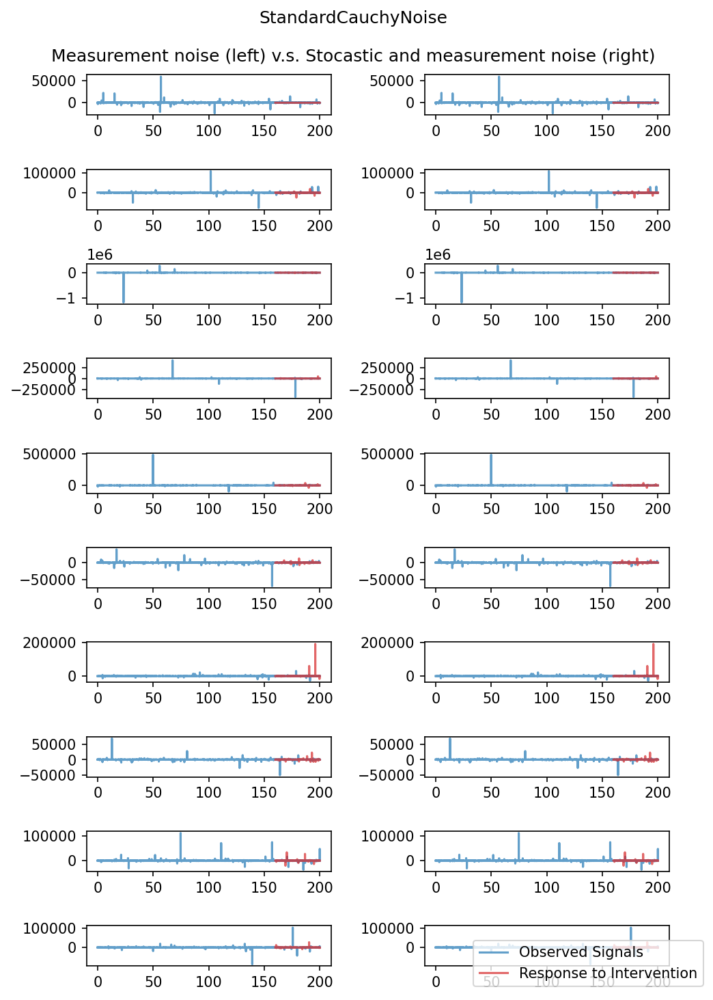

In [43]:
dim = 10

params = dict(
    model_type=interfere.dynamics.StandardCauchyNoise,
    model_params={
        "dim": dim,
        "measurement_noise_std": None,
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.12431192398071289 Estimated job time: 0.0017265544997321235 hours.


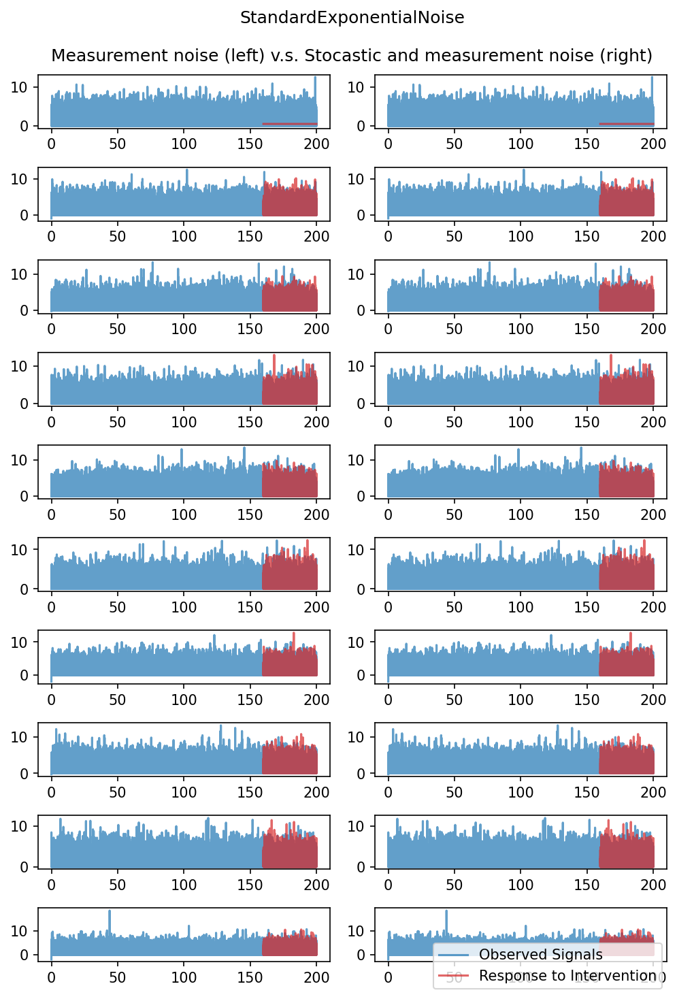

In [44]:
dim = 10

params = dict(
    model_type=interfere.dynamics.StandardExponentialNoise,
    model_params={
        "dim": dim,
        "measurement_noise_std": None,
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.12119722366333008 Estimated job time: 0.0016832947731018066 hours.


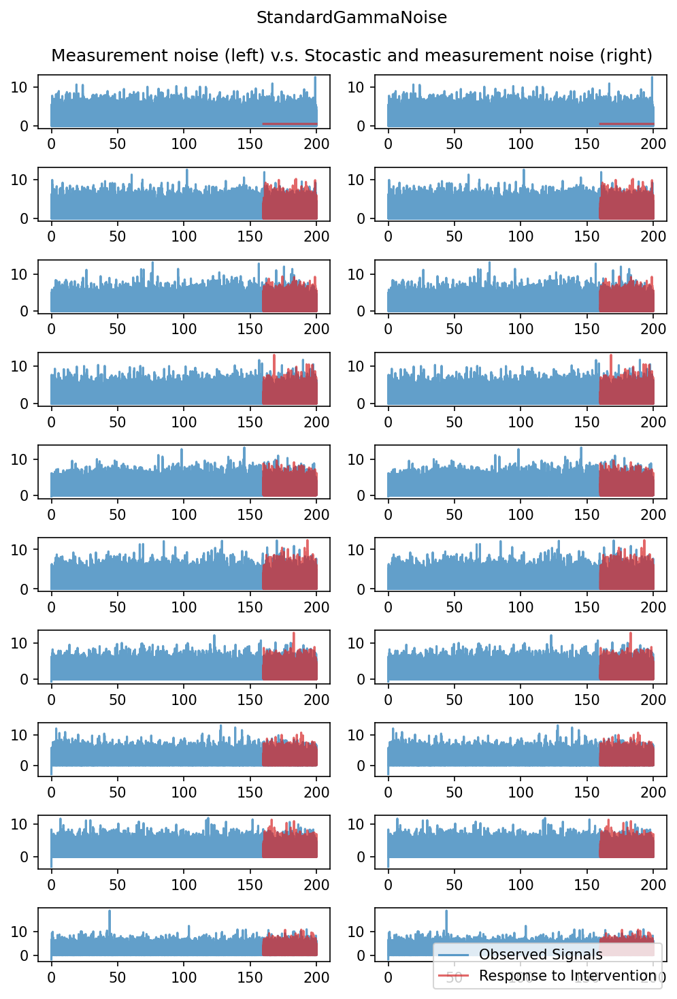

In [45]:
dim = 10

params = dict(
    model_type=interfere.dynamics.StandardGammaNoise,
    model_params={
        "dim": dim,
        "measurement_noise_std": None,
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.1373448371887207 Estimated job time: 0.0019075671831766765 hours.


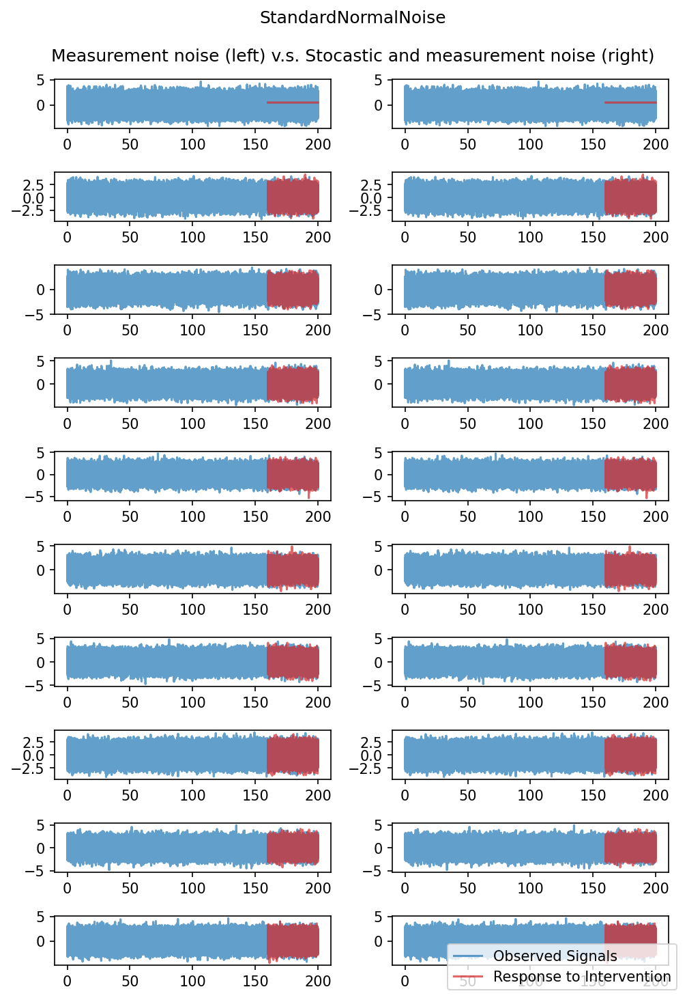

In [46]:
dim = 10

params = dict(
    model_type=interfere.dynamics.StandardNormalNoise,
    model_params={
        "dim": dim,
        "measurement_noise_std": None,
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 0.1516258716583252 Estimated job time: 0.0021059148841434056 hours.


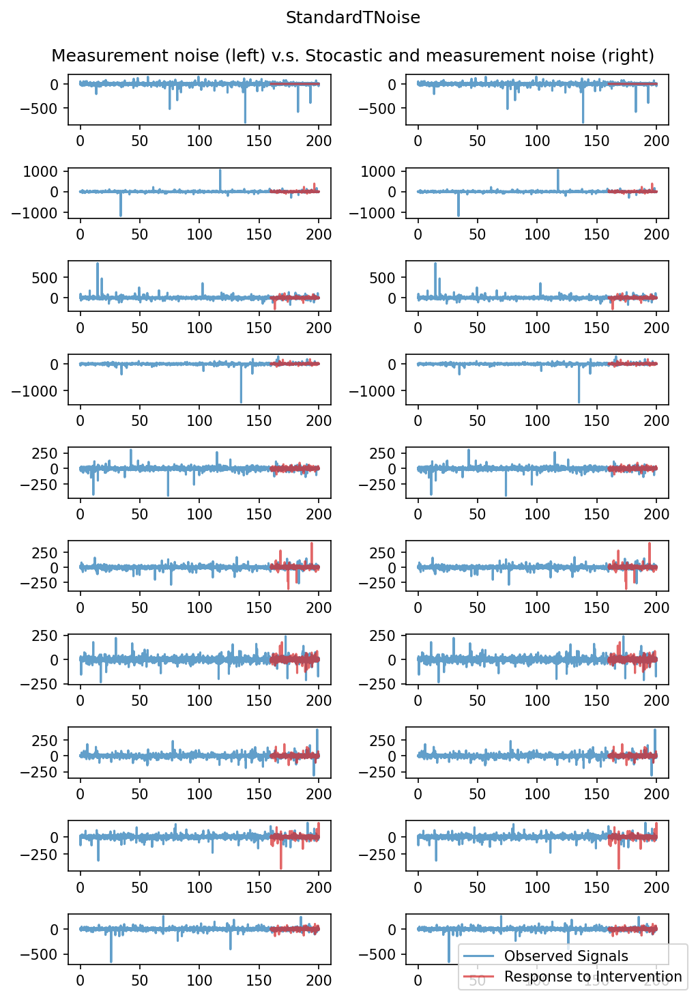

In [47]:
dim = 10

params = dict(
    model_type=interfere.dynamics.StandardTNoise,
    model_params={
        "dim": dim,
        "measurement_noise_std": None,
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=200, dt=0.001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### VARMA Models

In [48]:
from statsmodels.tsa.statespace.varmax import VARMAX

def extract_covariance(statsmodels_var_result):
    cov_table = np.array(statsmodels_var_result.summary().tables[-1])
    # Extract entries
    X = np.vectorize(lambda x: x.data)(cov_table)

    # Initialize empty cov matrix
    cov = [["0"]* 10 for i in range(10)]
    for i in range(0, 10):
        for j in range(i+1):
            cov[i][j] = X[j + i + 1, 1]

    cov = np.array(cov, float)
    cov = cov + np.tril(cov).T
    return cov

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          565     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.18259D+01    |proj g|=  1.12234D+01


 This problem is unconstrained.



At iterate    5    f= -1.22271D+01    |proj g|=  6.09022D+00

At iterate   10    f= -1.26626D+01    |proj g|=  8.06771D+00

At iterate   15    f= -1.29869D+01    |proj g|=  4.29301D+00

At iterate   20    f= -1.31529D+01    |proj g|=  3.10785D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
  565     23     27      1     0     0   2.346D+00  -1.321D+01
  F =  -13.212617919735205     

STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT        


/Users/djpassey/Code/interfere/interfere/dynamics/statespace_models.py:117: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  noise_vecs = rng.multivariate_normal(


Simulation time: 0.12514185905456543 Estimated job time: 0.0017380813757578533 hours.


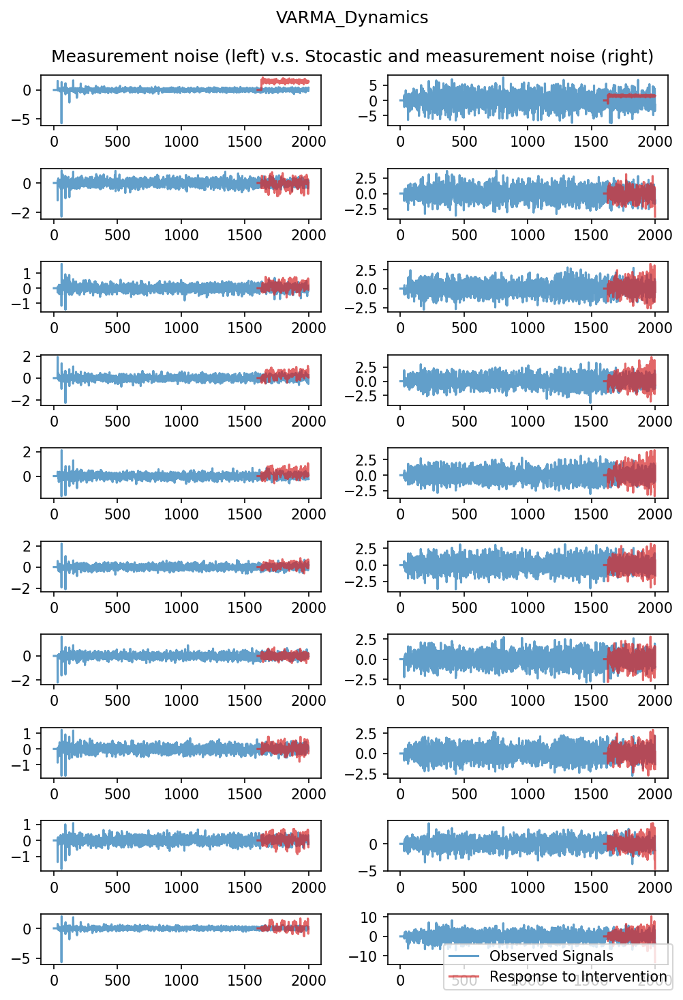

In [49]:
dim = 10

model = interfere.dynamics.coupled_map_1dlattice_spatiotemp_chaos(**{
    "dim": dim,
    "sigma": 0.0,
    "measurement_noise_std": 0.05 * np.ones(dim)
})

X = model.simulate(np.ones(dim), np.arange(100))
varma = VARMAX(X, order=(2, 3)).fit()

params = dict(
    model_type=interfere.dynamics.VARMA_Dynamics,
    model_params={
        "phi_matrices": varma.coefficient_matrices_var,
        "theta_matrices": varma.coefficient_matrices_vma,
        "sigma": np.zeros((dim, dim)),
        "measurement_noise_std": 0.2 * np.ones(dim),
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 1.5},
    # Nodes begin synchronized.
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = extract_covariance(varma)

plot_helper(params, noise_params)

all_params += [params, noise_params]

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          565     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.93296D-01    |proj g|=  1.27575D+02

At iterate    5    f= -7.47991D+00    |proj g|=  5.40967D+01

At iterate   10    f= -9.64949D+00    |proj g|=  9.01637D+00

At iterate   15    f= -1.06458D+01    |proj g|=  2.35411D+01

At iterate   20    f= -1.12364D+01    |proj g|=  1.10342D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
  565     21     27      1     0     0   6.109D+00  -1.132D+01
  F =  -11.321889398384211     

STOP: T

/Users/djpassey/Code/interfere/interfere/dynamics/statespace_models.py:117: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  noise_vecs = rng.multivariate_normal(


Simulation time: 0.12220907211303711 Estimated job time: 0.001697348223792182 hours.


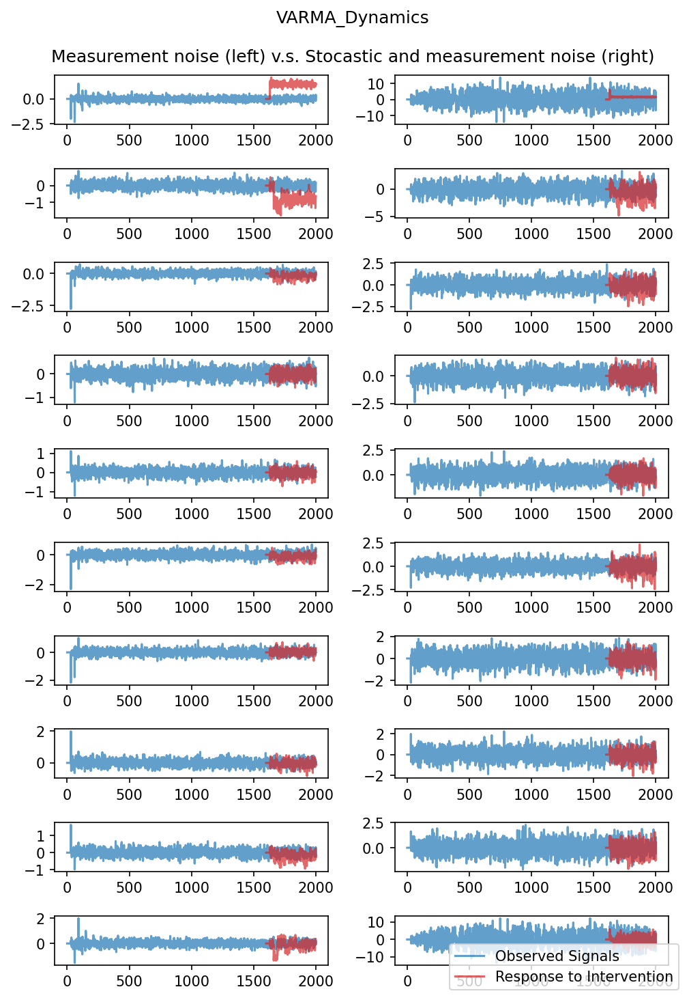

In [50]:
dim = 10

model = interfere.dynamics.coupled_map_1dlattice_chaotic_brownian(**{
    "dim": dim,
    "sigma": 0.0,
    "measurement_noise_std": 0.05 * np.ones(dim)
})

X = model.simulate(np.ones(dim), np.arange(100))
varma = VARMAX(X, order=(2, 3)).fit()

params = dict(
    model_type=interfere.dynamics.VARMA_Dynamics,
    model_params={
        "phi_matrices": varma.coefficient_matrices_var,
        "theta_matrices": varma.coefficient_matrices_vma,
        "sigma": np.zeros((dim, dim)),
        "measurement_noise_std": 0.2 * np.ones(dim),
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 1.5},
    # Nodes begin synchronized.
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = extract_covariance(varma)

plot_helper(params, noise_params)

all_params += [params, noise_params]

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          565     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.42779D-01    |proj g|=  2.25634D-01


 This problem is unconstrained.



At iterate    5    f=  6.42169D-01    |proj g|=  1.60595D+00

At iterate   10    f=  6.35325D-01    |proj g|=  1.90225D+00

At iterate   15    f=  6.34629D-01    |proj g|=  1.85858D-01

At iterate   20    f=  6.30392D-01    |proj g|=  3.71498D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
  565     20     27      1     0     0   3.715D+00   6.304D-01
  F =  0.63039156828633824     

STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT        


/Users/djpassey/Code/interfere/interfere/dynamics/statespace_models.py:117: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  noise_vecs = rng.multivariate_normal(


Simulation time: 0.12256789207458496 Estimated job time: 0.0017023318343692357 hours.


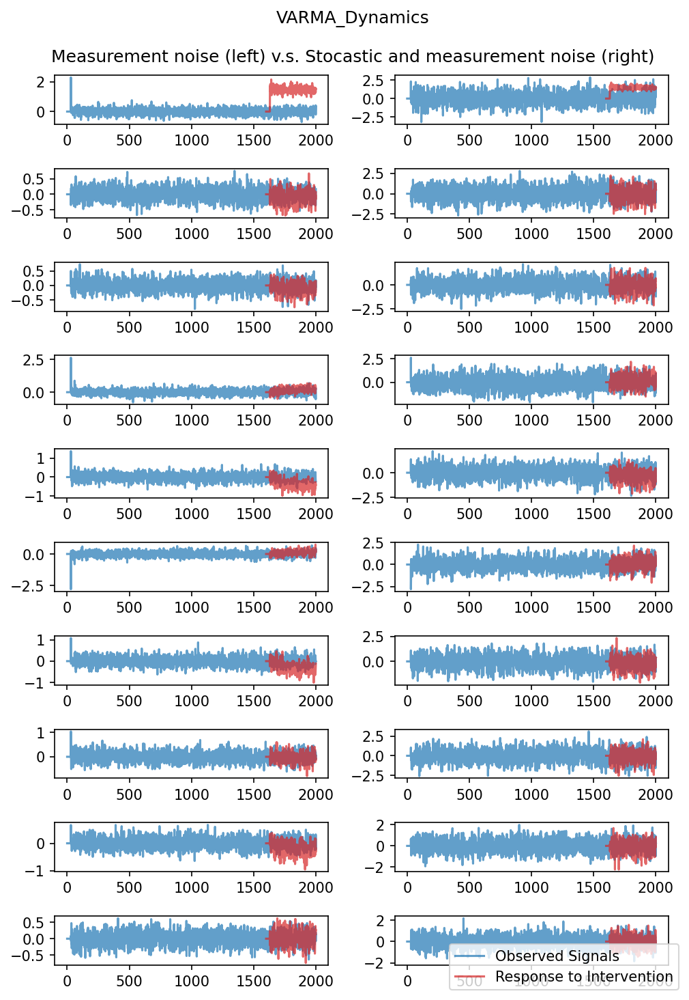

In [51]:
dim = 10

# Fit a VARMA model to one of the previous dynamical systems
model = interfere.dynamics.LotkaVolteraSDE(
    **{
        # All nodes have the same growth rate
        "growth_rates": np.ones(dim),
        "capacities": 20 * np.ones(dim),
        # Three cycle and isolated node
        "interaction_mat": np.array([
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0.01,
        "measurement_noise_std": 0.25 * np.ones(dim)
    }
)

X = model.simulate(10 * np.ones(dim), np.linspace(0, 10, 1000))
varma = VARMAX(X, order=(2, 3)).fit()

params = dict(
    model_type=interfere.dynamics.VARMA_Dynamics,
    model_params={
        "phi_matrices": varma.coefficient_matrices_var,
        "theta_matrices": varma.coefficient_matrices_vma,
        "sigma": np.zeros((dim, dim)),
        "measurement_noise_std": 0.2 * np.ones(dim),
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 1.5},
    # Nodes begin synchronized.
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = extract_covariance(varma)

plot_helper(params, noise_params)

all_params += [params, noise_params]

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          565     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.67679D-01    |proj g|=  2.21580D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
  565      1      5      1     0     0   3.639D+05   2.395D+05
  F =   239532.02338819258     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


/Users/djpassey/Code/interfere/interfere/dynamics/statespace_models.py:117: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  noise_vecs = rng.multivariate_normal(


Simulation time: 0.12595582008361816 Estimated job time: 0.0017493863900502522 hours.


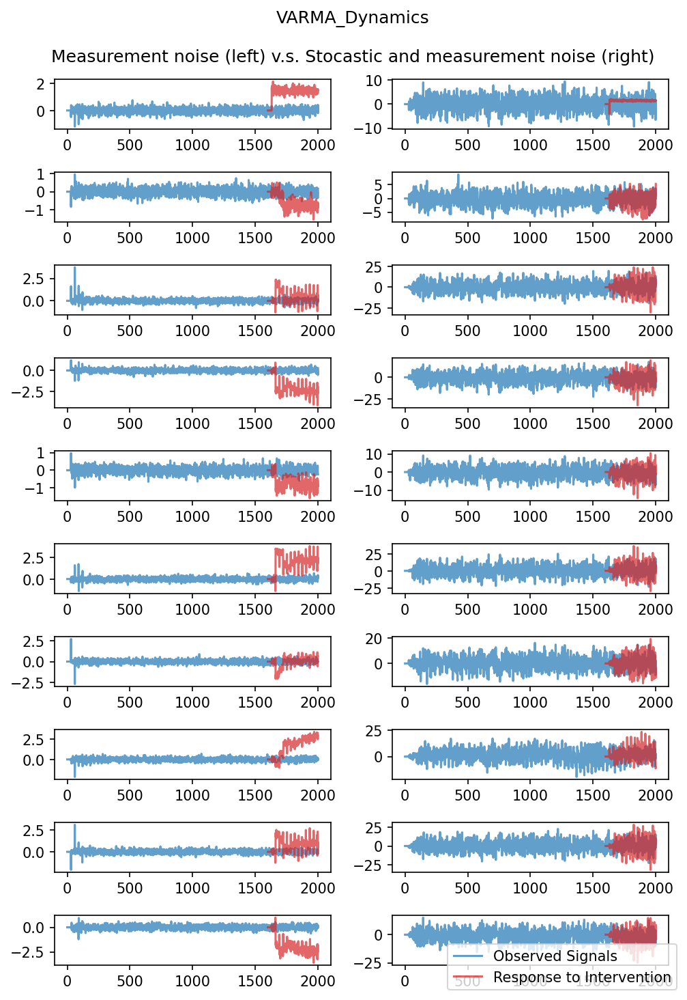

In [52]:
dim = 10

# Fit a VARMA model to one of the previous dynamical systems
model = interfere.dynamics.LotkaVolteraSDE(
    **{
        # All nodes have the same growth rate
        "growth_rates": NOTEBOOK_RNG.random(dim),
        "capacities": 20 * np.ones(dim),
        # Three cycle and isolated node
        "interaction_mat": np.array([
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0.01,
        "measurement_noise_std": 0.25 * np.ones(dim)
    }
)

X = model.simulate(10 * np.ones(dim), np.linspace(0, 10, 1000))
varma = VARMAX(X, order=(2, 3)).fit()

params = dict(
    model_type=interfere.dynamics.VARMA_Dynamics,
    model_params={
        "phi_matrices": varma.coefficient_matrices_var,
        "theta_matrices": varma.coefficient_matrices_vma,
        "sigma": np.zeros((dim, dim)),
        "measurement_noise_std": 0.2 * np.ones(dim),
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 1.5},
    # Nodes begin synchronized.
    initial_conds=uniform_init_cond(-3, 3, dim, REPS),
    start_time=0, end_time=2000, dt=1,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = extract_covariance(varma)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Additional Hodgkin Huxley Models

Simulation time: 2222.008738040924 Estimated job time: 30.86123247279061 hours.


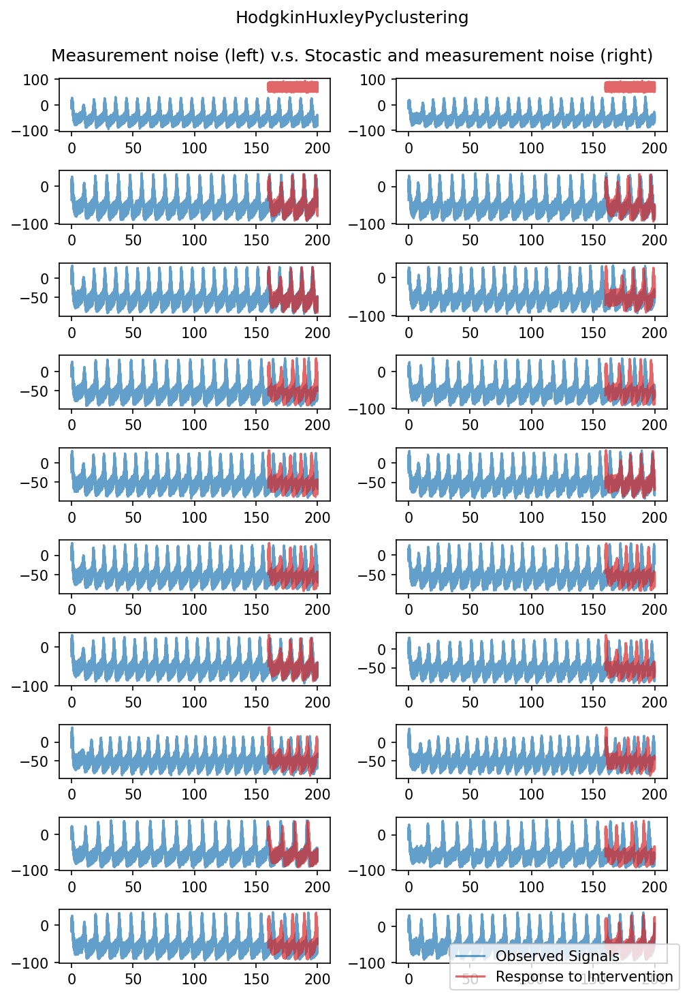

In [53]:
dim = 10

stimulus = NOTEBOOK_RNG.random(dim)
params = hhn_parameters()
params.w1 = 0.5
params.w2 = 0
params.w3 = 0
params.deltah = 400


params = dict(
    model_type=interfere.dynamics.HodgkinHuxleyPyclustering,
    model_params={
        "stimulus": NOTEBOOK_RNG.random(dim) * 50 + 20,
        "sigma": np.zeros(dim),
        "measurement_noise_std": 5 * np.ones(dim),
        "parameters": params,
        "type_conn": "list_bdir"
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 70},
    initial_conds=uniform_init_cond(-40, 10, dim, REPS),
    start_time=0, end_time=200, dt=0.0001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 5 * np.ones(dim)

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 2371.0264070034027 Estimated job time: 32.93092231949171 hours.


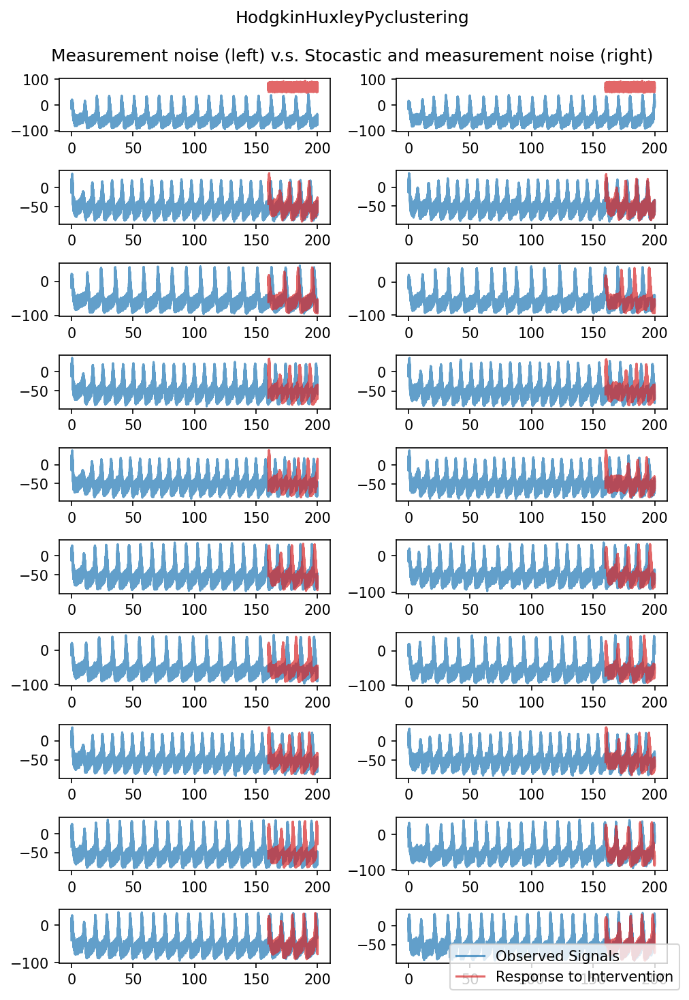

In [54]:
dim = 10

stimulus = NOTEBOOK_RNG.random(dim)
params = hhn_parameters()
params.w1 = 0.5
params.w2 = 0
params.w3 = 0
params.deltah = 400


params = dict(
    model_type=interfere.dynamics.HodgkinHuxleyPyclustering,
    model_params={
        "stimulus": NOTEBOOK_RNG.random(dim) * 50 + 20,
        "sigma": np.zeros(dim),
        "measurement_noise_std": 5 * np.ones(dim),
        "parameters": params,
        "type_conn": "grid_four"
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 70},
    initial_conds=uniform_init_cond(-40, 10, dim, REPS),
    start_time=0, end_time=200, dt=0.0001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 5 * np.ones(dim)

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 1565.0994911193848 Estimated job time: 21.737492932213677 hours.


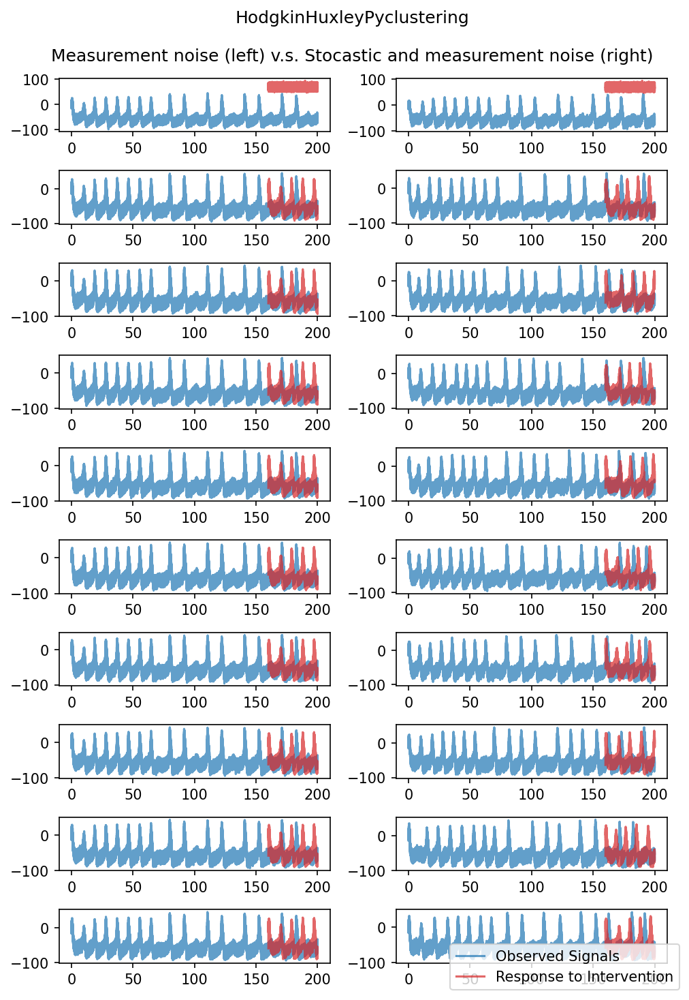

In [55]:
dim = 10

stimulus = NOTEBOOK_RNG.random(dim)
params = hhn_parameters()
params.w1 = 0.1
params.w2 = 0
params.w3 = 0.2
params.deltah = 400


params = dict(
    model_type=interfere.dynamics.HodgkinHuxleyPyclustering,
    model_params={
        "stimulus": 40 * np.ones(dim),
        "sigma": np.zeros(dim),
        "measurement_noise_std": 5 * np.ones(dim),
        "parameters": params,
        "type_conn": "grid_four"
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 70},
    initial_conds=uniform_init_cond(0, 0, dim, REPS),
    start_time=0, end_time=200, dt=0.0001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 5 * np.ones(dim)

plot_helper(params, noise_params)

all_params += [params, noise_params]

Simulation time: 1622.9519181251526 Estimated job time: 22.540998862849342 hours.


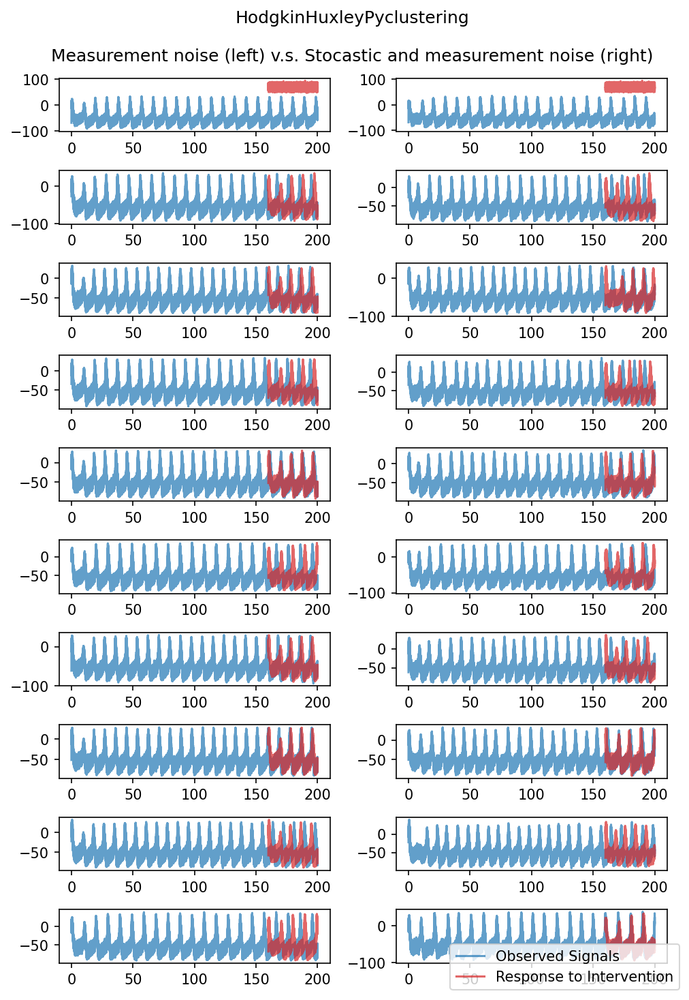

In [56]:
dim = 10

stimulus = NOTEBOOK_RNG.random(dim)
params = hhn_parameters()
params.w1 = 0.0
params.w2 = 0.0
params.w3 = 0.0
params.deltah = 400


params = dict(
    model_type=interfere.dynamics.HodgkinHuxleyPyclustering,
    model_params={
        "stimulus": 20 * NOTEBOOK_RNG.random(dim) + 30,
        "sigma": np.zeros(dim),
        "measurement_noise_std": 5 * np.ones(dim),
        "parameters": params,
        "type_conn": "grid_four"
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 70},
    initial_conds=uniform_init_cond(-70, 30, dim, REPS),
    start_time=0, end_time=200, dt=0.0001,
    rng = np.random.default_rng(SEED)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 5 * np.ones(dim)

plot_helper(params, noise_params)

all_params += [params, noise_params]

## Add different length simulation times to the parameter sets

In [57]:
dynamics_kwargs = []
dynamics_kwargs_small = []

DISCRETE_MED = 500
DISCRETE_SHORT = 100

CONT_MED = 50
CONT_SHORT = 10

for x in all_params:
    # Make medium and short timescale versions of the parameter set.
    med_x = deepcopy(x)
    short_x = deepcopy(x)

    # Discrete time end times.
    if x["dt"] == 1:
        med_x["end_time"] = DISCRETE_MED
        short_x["end_time"] = DISCRETE_SHORT

    # Continuous time end times.
    else:
        med_x["end_time"] = CONT_MED
        short_x["end_time"] = CONT_SHORT

    dynamics_kwargs += [x, med_x, short_x]
    dynamics_kwargs_small += [short_x]

# Grab five random models
dynamics_kwargs_small = [dynamics_kwargs_small[i] for i in [10, 20, 30, 41, 51]]


## Method Hyper Parameters

In [58]:
import pysindy as ps 

methods_kwargs = [

    dict(
        method_type=interfere.methods.VAR,
        method_params={},
        method_param_grid={
            "maxlags": [1, 2, 3, 10],
            "trend" : ["c", "ct", "ctt", "n"]
        },
        num_intervention_sims=3,
    ),

    dict(
        method_type=interfere.methods.SINDY,
        method_params={
            "differentiation_method": ps.SINDyDerivative(kind='spectral')
        },
        method_param_grid={
            "optimizer__threshold": [1e-8, 0.0001, 0.001, 0.01, 0.05, 0.1],
            "optimizer__alpha": [0.0, 1e-8, 1e-4, 1e-2, 0.1, 1.0, 5],
            "differentiation_method__kwargs": [
                {'kind': 'finite_difference', 'k': 1},
                {'kind': 'spline', 's': 1e-2},
                {'kind': 'spline', 's': 1e-1},
                {'kind': 'savitzky_golay', 'order': 2, 'left': .1, 'right': .1},
                {'kind': 'savitzky_golay', 'order': 3, 'left': .1, 'right': .1},
                {'kind': 'trend_filtered', 'order': 0, 'alpha': 1e-2}
            ]
        },
        num_intervention_sims=1,
    ),


    dict(
        method_type=interfere.methods.LTSFLinearForecaster,
        method_params={"seq_len": 1, "pred_len": 1},
        method_param_grid={
            "seq_len": [1, 2, 5, 10, 50],
            "lr": [0.001, 0.03, 0.1],
            "pred_len": [1, 2, 3]
        },
        num_intervention_sims=1,

    )

]

# Make a smaller dictionary of methods for testing that everything runs.
# Use fewer hyper parameters.

methods_kwargs_small = [

    dict(
        method_type=interfere.methods.VAR,
        method_params={},
        method_param_grid={
            "maxlags": [1],
            "trend" : ["c"]
        },
        num_intervention_sims=3,

    ),

    dict(
        method_type=interfere.methods.SINDY,
        method_params={
            "differentiation_method": ps.SINDyDerivative(kind='spectral')
        },
        method_param_grid={
            "optimizer__threshold": [1e-8],
            "optimizer__alpha": [0.0],
            "differentiation_method__kwargs": [
                {'kind': 'trend_filtered', 'order': 0, 'alpha': 1e-2}
            ]
        },
        num_intervention_sims=3,
    ),


    dict(
        method_type=interfere.methods.LTSFLinearForecaster,
        method_params={"seq_len": 1, "pred_len": 1},
        method_param_grid={
            "seq_len": [1],
            "lr": [0.03],
            "pred_len": [3]
        },
        num_intervention_sims=3,
    )

]

## Save the parameter sets

In [59]:
if SAVE_PARAMS:
    # Full set of dynamic models.
    with open("/Users/djpassey/Code/interfere/experiments/exp1/dynamic_models.pkl", "wb") as f:
        pkl.dump(dynamics_kwargs, f)


    # Dynamic models with shortest time scale only.
    with open("/Users/djpassey/Code/interfere/experiments/exp1/dynamic_models_small.pkl", "wb") as f:
        pkl.dump(dynamics_kwargs_small, f)

    # Methods will full hyper parameter options.
    with open("/Users/djpassey/Code/interfere/experiments/exp1/inference_methods.pkl", "wb") as f:
        pkl.dump(methods_kwargs, f)

    # Methods with less hyper parameters
    with open("/Users/djpassey/Code/interfere/experiments/exp1/inference_methods_small.pkl", "wb") as f:
        pkl.dump(methods_kwargs_small, f)
    